In [2]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperature
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperature
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperature
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    #print("Agg:")
    agg.columns = names
    #print(type(agg))
    #print(agg)

    #print("Test columns:")
    #print(agg.iloc[:, -36]) # Column containing response actual values (temperature) at time t

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    print(n_vars)
    print(len(data))
    print(type(data))

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    #print("Diff values:")
    #print(len(diff_values))
    #print(len(diff_values[0]))
    #print(len(diff_values_for_training))
    #print(len(diff_values_for_training[0]))
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    #print("Scaled values rows:")
    #print(len(scaled_values))

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        #print("Batch "+str(ws+1)+":")
        #print("Range: "+str(first)+"-"+str(last))
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
        #print("Supervised count:")
        #print(len(supervised_values))
        #print(len(supervised_values[0]))
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    print(n_vars)
    print(len(data))
    print(type(data))

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    #print("Diff values:")
    #print(len(diff_values))
    #print(len(diff_values[0]))
    #print(len(diff_values_for_training))
    #print(len(diff_values_for_training[0]))
    
    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        #print("Batch "+str(ws+1)+":")
        #print("Range: "+str(first)+"-"+str(last))
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
        #print("Supervised count:")
        #print(len(supervised_values))
        #print(len(supervised_values[0]))
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 3
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
    #print("Train_X Fold "+str(i)+":")
    #print(len(train_X[i]))
    #print(len(train_X[i][0]))
    #print(len(train_X[i][0][0])) 
    #print("Train_y Fold "+str(i)+":")
    #print(len(train_y[i]))
    #print(len(train_y[i][0]))
    #print(train_y[i][0][0])
    #print("Validation_X Fold "+str(i)+":")
    #print(len(val_X[i]))
    #print(len(val_X[i][0]))
    #print(len(val_X[i][0][0]))
    #print("Validation_y Fold "+str(i)+":")
    #print(len(val_y[i]))
    #print(len(val_y[i][0]))
    #print(val_y[i][0][0])
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)
     

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + 12*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]


Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 3
C:\Users\User
C:\Users\User\Modeling\
Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
12
84
<class 'list'>
12
21
<class 'list'>
(84, 1, 1, 2151)
(11, 1, 1, 2151)
(10, 1, 1, 2151)
(84, 1, 2151)
(11, 1, 2151)
(10, 1, 2151)
(84, 2151)
(11, 2151)
(10, 2151)
[[0.39307412 0.69695044 0.32924264 ... 0.45747266 0.31713244 0.95078979]
 [0.45747266 0.51683609 0.42215989 ... 0.5246051  0.60753341 0.55194411]
 [0.38487242 0.62674714 0.3411641  ... 0.4954435  0.36968408 0.88061968]
 ...
 [0.54100851 0.46473952 0.46949509 ... 0.4936209  0.51123937 0.49696233]
 [0.44896719 0.51620076 0.3997195  ... 0.54009721 0.55103281 0.59629405]
 [0.46780073 0.52414231 0.42356241 ... 0.49696233 0.58961118 0.50880923]]
Fold 2:
12
84
<class 'list'>
12
21
<class 'list'>
(84, 1, 1, 2151)
(11, 1, 1, 2151)
(10, 1, 1, 2151)
(84, 1, 2151)
(11, 1, 2151)
(10, 1, 2151)
(84, 2151)
(11, 2151)
(10, 2151)
[[0.38166311 0.6

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

3
179
(84, 2151)
(11, 2151)


[I 2025-05-20 03:43:46,087] A new study created in memory with name: no-name-723f7fb1-b126-4698-8709-4f5cf3d64e20
[I 2025-05-20 03:48:49,182] Trial 0 finished with value: 0.1671631634235382 and parameters: {'lr': 0.27978804921662065, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.29383122461720557}. Best is trial 0 with value: 0.1671631634235382.


Cross Validation Accuracies:
[0.15205208957195282, 0.16571255028247833, 0.12686768174171448, 0.21551834046840668, 0.17566515505313873]
Mean Cross Validation Accuracy:
0.1671631634235382
Standard Deviation of Cross Validation Accuracy:
0.02920507381984729


[I 2025-05-20 03:56:01,631] Trial 1 finished with value: 0.09358077496290207 and parameters: {'lr': 0.01561969032835342, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.42682121254753835}. Best is trial 1 with value: 0.09358077496290207.


Cross Validation Accuracies:
[0.06441674381494522, 0.07589587569236755, 0.11009657382965088, 0.13699066638946533, 0.08050401508808136]
Mean Cross Validation Accuracy:
0.09358077496290207
Standard Deviation of Cross Validation Accuracy:
0.026425322362100268


[I 2025-05-20 04:04:42,230] Trial 2 finished with value: 0.08552323579788208 and parameters: {'lr': 0.004511968149169282, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.17254197518237152}. Best is trial 2 with value: 0.08552323579788208.


Cross Validation Accuracies:
[0.06784447282552719, 0.08550496399402618, 0.09523642808198929, 0.09930062294006348, 0.07972969114780426]
Mean Cross Validation Accuracy:
0.08552323579788208
Standard Deviation of Cross Validation Accuracy:
0.011227347456256555


[I 2025-05-20 04:11:57,834] Trial 3 finished with value: 0.10460865944623947 and parameters: {'lr': 0.005562762478747946, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.2184177921702577}. Best is trial 2 with value: 0.08552323579788208.


Cross Validation Accuracies:
[0.06478552520275116, 0.09775271266698837, 0.10658052563667297, 0.12697510421276093, 0.12694942951202393]
Mean Cross Validation Accuracy:
0.10460865944623947
Standard Deviation of Cross Validation Accuracy:
0.022961455276675716


[I 2025-05-20 04:18:19,896] Trial 4 finished with value: 0.7014120101928711 and parameters: {'lr': 0.031320783809476865, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.14767827229845595}. Best is trial 2 with value: 0.08552323579788208.


Cross Validation Accuracies:
[0.7281145453453064, 0.8308482766151428, 0.3644765615463257, 0.793753981590271, 0.7898666858673096]
Mean Cross Validation Accuracy:
0.7014120101928711
Standard Deviation of Cross Validation Accuracy:
0.17166452069882204


[I 2025-05-20 04:24:58,135] Trial 5 finished with value: 3.7802047967910766 and parameters: {'lr': 0.2519400535740273, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.33265407796019997}. Best is trial 2 with value: 0.08552323579788208.


Cross Validation Accuracies:
[0.8450037240982056, 4.165378093719482, 5.936608791351318, 3.1440038681030273, 4.81002950668335]
Mean Cross Validation Accuracy:
3.7802047967910766
Standard Deviation of Cross Validation Accuracy:
1.7250584076098805


[I 2025-05-20 04:33:00,808] Trial 6 finished with value: 0.08800585493445397 and parameters: {'lr': 0.007097247780387515, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.24812869603822538}. Best is trial 2 with value: 0.08552323579788208.


Cross Validation Accuracies:
[0.06222871318459511, 0.07741815596818924, 0.084876149892807, 0.12617453932762146, 0.089331716299057]
Mean Cross Validation Accuracy:
0.08800585493445397
Standard Deviation of Cross Validation Accuracy:
0.021189439994976956


[I 2025-05-20 04:40:14,404] Trial 7 finished with value: 0.1251523017883301 and parameters: {'lr': 0.0019367054816472355, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2194609826974095}. Best is trial 2 with value: 0.08552323579788208.


Cross Validation Accuracies:
[0.10613290965557098, 0.11686734855175018, 0.15839603543281555, 0.11412592232227325, 0.13023929297924042]
Mean Cross Validation Accuracy:
0.1251523017883301
Standard Deviation of Cross Validation Accuracy:
0.01834656413262902


[I 2025-05-20 04:46:06,941] Trial 8 finished with value: 0.08498948737978936 and parameters: {'lr': 0.003107574397693543, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19382389119732926}. Best is trial 8 with value: 0.08498948737978936.


Cross Validation Accuracies:
[0.060328368097543716, 0.06628966331481934, 0.10793162137269974, 0.10180217772722244, 0.08859560638666153]
Mean Cross Validation Accuracy:
0.08498948737978936
Standard Deviation of Cross Validation Accuracy:
0.018867254105847137


[I 2025-05-20 04:51:53,479] Trial 9 finished with value: 0.9004161655902863 and parameters: {'lr': 0.07802389335818559, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.296501828309657}. Best is trial 8 with value: 0.08498948737978936.


Cross Validation Accuracies:
[1.0089187622070312, 0.5608752369880676, 0.41022565960884094, 2.0082600116729736, 0.5138011574745178]
Mean Cross Validation Accuracy:
0.9004161655902863
Standard Deviation of Cross Validation Accuracy:
0.5906160748958016


[I 2025-05-20 04:57:29,241] Trial 10 finished with value: 0.18818284571170807 and parameters: {'lr': 0.0010701714267150855, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11057411437304238}. Best is trial 8 with value: 0.08498948737978936.


Cross Validation Accuracies:
[0.20311203598976135, 0.23900824785232544, 0.1485855132341385, 0.10405150055885315, 0.24615693092346191]
Mean Cross Validation Accuracy:
0.18818284571170807
Standard Deviation of Cross Validation Accuracy:
0.05443000782256324


[I 2025-05-20 05:04:37,286] Trial 11 finished with value: 0.09414705336093902 and parameters: {'lr': 0.0032353533342644905, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1618503183297561}. Best is trial 8 with value: 0.08498948737978936.


Cross Validation Accuracies:
[0.0824643075466156, 0.0930803120136261, 0.09084862470626831, 0.10758478194475174, 0.09675724059343338]
Mean Cross Validation Accuracy:
0.09414705336093902
Standard Deviation of Cross Validation Accuracy:
0.008196215533220258


[I 2025-05-20 05:12:17,667] Trial 12 finished with value: 0.08519735112786293 and parameters: {'lr': 0.01226462803766616, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.18096935353214524}. Best is trial 8 with value: 0.08498948737978936.


Cross Validation Accuracies:
[0.060195859521627426, 0.06934566795825958, 0.11248812079429626, 0.10020742565393448, 0.0837496817111969]
Mean Cross Validation Accuracy:
0.08519735112786293
Standard Deviation of Cross Validation Accuracy:
0.01922776448186653


[I 2025-05-20 05:20:02,575] Trial 13 finished with value: 0.08467415124177932 and parameters: {'lr': 0.016403692936722926, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3756190632567639}. Best is trial 13 with value: 0.08467415124177932.


Cross Validation Accuracies:
[0.07075031101703644, 0.06173058599233627, 0.10458533465862274, 0.10416562855243683, 0.08213889598846436]
Mean Cross Validation Accuracy:
0.08467415124177932
Standard Deviation of Cross Validation Accuracy:
0.017338286795240968


[I 2025-05-20 05:24:35,628] Trial 14 finished with value: 0.4231293186545372 and parameters: {'lr': 0.07174828232264421, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.40396077990899065}. Best is trial 13 with value: 0.08467415124177932.


Cross Validation Accuracies:
[1.7272205352783203, 0.10729292035102844, 0.0872734859585762, 0.09867431968450546, 0.09518533200025558]
Mean Cross Validation Accuracy:
0.4231293186545372
Standard Deviation of Cross Validation Accuracy:
0.652077292483625


[I 2025-05-20 05:32:56,680] Trial 15 finished with value: 0.07865819334983826 and parameters: {'lr': 0.024575260536176022, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.48305862778382935}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06619957089424133, 0.05605299770832062, 0.08687414973974228, 0.10267636924982071, 0.08148787915706635]
Mean Cross Validation Accuracy:
0.07865819334983826
Standard Deviation of Cross Validation Accuracy:
0.01623942103779148


[I 2025-05-20 05:40:50,556] Trial 16 finished with value: 4.287306213378907 and parameters: {'lr': 0.052479080122840666, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.49063171728666677}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[4.785933017730713, 4.047528266906738, 3.5987868309020996, 4.686090469360352, 4.318192481994629]
Mean Cross Validation Accuracy:
4.287306213378907
Standard Deviation of Cross Validation Accuracy:
0.43362747562543247


[I 2025-05-20 05:47:07,288] Trial 17 finished with value: 0.1193522185087204 and parameters: {'lr': 0.6687729855541894, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4921511729003469}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.10233327746391296, 0.0858709067106247, 0.144681915640831, 0.15473802387714386, 0.10913696885108948]
Mean Cross Validation Accuracy:
0.1193522185087204
Standard Deviation of Cross Validation Accuracy:
0.02611031481216594


[I 2025-05-20 05:55:51,592] Trial 18 finished with value: 0.0858168825507164 and parameters: {'lr': 0.01676508521296425, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.39641852759534457}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06504899263381958, 0.06717563420534134, 0.11522972583770752, 0.10212228447198868, 0.07950777560472488]
Mean Cross Validation Accuracy:
0.0858168825507164
Standard Deviation of Cross Validation Accuracy:
0.019746329805660493


[I 2025-05-20 06:04:33,641] Trial 19 finished with value: 2.311810779571533 and parameters: {'lr': 0.03024528521749648, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4482448102091122}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[2.2667481899261475, 2.3070430755615234, 2.3038408756256104, 2.361335277557373, 2.3200864791870117]
Mean Cross Validation Accuracy:
2.311810779571533
Standard Deviation of Cross Validation Accuracy:
0.03045669207533153


[I 2025-05-20 06:10:09,640] Trial 20 finished with value: 0.0833424985408783 and parameters: {'lr': 0.1536752823440233, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3508466312632667}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.0618516243994236, 0.05801093205809593, 0.09692101925611496, 0.11650503426790237, 0.08342388272285461]
Mean Cross Validation Accuracy:
0.0833424985408783
Standard Deviation of Cross Validation Accuracy:
0.021852608795660096


[I 2025-05-20 06:16:22,738] Trial 21 finished with value: 0.08224620148539544 and parameters: {'lr': 0.14791486318817323, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.36125135349829735}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.0655665248632431, 0.056909311562776566, 0.09856706112623215, 0.11044374108314514, 0.0797443687915802]
Mean Cross Validation Accuracy:
0.08224620148539544
Standard Deviation of Cross Validation Accuracy:
0.01993941056691937


[I 2025-05-20 06:22:07,101] Trial 22 finished with value: 0.08349489346146584 and parameters: {'lr': 0.19356155859394647, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.34212913863907235}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06293092668056488, 0.060748692601919174, 0.10321250557899475, 0.10994449257850647, 0.0806378498673439]
Mean Cross Validation Accuracy:
0.08349489346146584
Standard Deviation of Cross Validation Accuracy:
0.020183134555747443


[I 2025-05-20 06:27:47,072] Trial 23 finished with value: 0.08785876706242561 and parameters: {'lr': 0.10973992206198598, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3559078904023742}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.07065797597169876, 0.05836143717169762, 0.10789105296134949, 0.11209530383348465, 0.09028806537389755]
Mean Cross Validation Accuracy:
0.08785876706242561
Standard Deviation of Cross Validation Accuracy:
0.02078732002017819


[I 2025-05-20 06:34:04,868] Trial 24 finished with value: 0.1495340034365654 and parameters: {'lr': 0.8890224345463505, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4551808627157924}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.15376652777194977, 0.11538951843976974, 0.14497879147529602, 0.1706569343805313, 0.16287824511528015]
Mean Cross Validation Accuracy:
0.1495340034365654
Standard Deviation of Cross Validation Accuracy:
0.019124628475354056


[I 2025-05-20 06:38:47,879] Trial 25 finished with value: 0.0806951142847538 and parameters: {'lr': 0.4290659960423447, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.27076210903955045}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06877120584249496, 0.053846266120672226, 0.09980147331953049, 0.10064825415611267, 0.08040837198495865]
Mean Cross Validation Accuracy:
0.0806951142847538
Standard Deviation of Cross Validation Accuracy:
0.01803498382430976


[I 2025-05-20 06:43:25,150] Trial 26 finished with value: 0.08373798206448554 and parameters: {'lr': 0.4390377399865974, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2533284908283621}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.08191385120153427, 0.056728776544332504, 0.08492398262023926, 0.11632228642702103, 0.07880101352930069]
Mean Cross Validation Accuracy:
0.08373798206448554
Standard Deviation of Cross Validation Accuracy:
0.01908057537214766


[I 2025-05-20 06:48:28,603] Trial 27 finished with value: 0.09121573492884635 and parameters: {'lr': 0.37927256783945507, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.26561789835297944}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.08336556702852249, 0.05623921379446983, 0.1328759789466858, 0.10341901332139969, 0.08017890155315399]
Mean Cross Validation Accuracy:
0.09121573492884635
Standard Deviation of Cross Validation Accuracy:
0.02565653832005263


[I 2025-05-20 06:53:28,779] Trial 28 finished with value: 0.09391482770442963 and parameters: {'lr': 0.04475140350840025, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.30158990672874547}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06747577339410782, 0.0797969326376915, 0.09913868457078934, 0.12483520060777664, 0.09832754731178284]
Mean Cross Validation Accuracy:
0.09391482770442963
Standard Deviation of Cross Validation Accuracy:
0.019499583530501078


[I 2025-05-20 06:58:24,659] Trial 29 finished with value: 0.0922707736492157 and parameters: {'lr': 0.1277383459734945, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.31345831393126566}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06873451173305511, 0.08961830288171768, 0.10256490111351013, 0.10978283733129501, 0.09065331518650055]
Mean Cross Validation Accuracy:
0.0922707736492157
Standard Deviation of Cross Validation Accuracy:
0.013973180258577456


[I 2025-05-20 07:02:56,773] Trial 30 finished with value: 0.083018459379673 and parameters: {'lr': 0.4657252303374264, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4590826485448196}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.0739322304725647, 0.05787365138530731, 0.0871739313006401, 0.11076896637678146, 0.08534351736307144]
Mean Cross Validation Accuracy:
0.083018459379673
Standard Deviation of Cross Validation Accuracy:
0.017364247204728248


[I 2025-05-20 07:06:56,382] Trial 31 finished with value: 0.09250471293926239 and parameters: {'lr': 0.5135198371070011, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4468626272747675}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.0834331288933754, 0.06370106339454651, 0.09012039005756378, 0.13386107981204987, 0.0914079025387764]
Mean Cross Validation Accuracy:
0.09250471293926239
Standard Deviation of Cross Validation Accuracy:
0.02293111830579487


[I 2025-05-20 07:10:59,150] Trial 32 finished with value: 0.14732602536678313 and parameters: {'lr': 0.9693738079870085, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4652225754702525}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.15848326683044434, 0.16086170077323914, 0.16078782081604004, 0.1324511617422104, 0.12404617667198181]
Mean Cross Validation Accuracy:
0.14732602536678313
Standard Deviation of Cross Validation Accuracy:
0.015824862752058817


[I 2025-05-20 07:14:54,331] Trial 33 finished with value: 0.08480945378541946 and parameters: {'lr': 0.2780825252127224, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4208493813845693}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.0646500363945961, 0.08211887627840042, 0.0830867663025856, 0.10770796984434128, 0.08648362010717392]
Mean Cross Validation Accuracy:
0.08480945378541946
Standard Deviation of Cross Validation Accuracy:
0.01373865961144549


[I 2025-05-20 07:20:02,463] Trial 34 finished with value: 0.08346942216157913 and parameters: {'lr': 0.360317039864015, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3769974377265142}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.0637381300330162, 0.05384443700313568, 0.10444671660661697, 0.10846824198961258, 0.08684958517551422]
Mean Cross Validation Accuracy:
0.08346942216157913
Standard Deviation of Cross Validation Accuracy:
0.021648912267038974


[I 2025-05-20 07:25:12,221] Trial 35 finished with value: 0.08241852074861526 and parameters: {'lr': 0.1949389265243516, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.47786058972132117}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06457428634166718, 0.056488677859306335, 0.09406991302967072, 0.10599641501903534, 0.09096331149339676]
Mean Cross Validation Accuracy:
0.08241852074861526
Standard Deviation of Cross Validation Accuracy:
0.01873744349168586


[I 2025-05-20 07:30:13,434] Trial 36 finished with value: 0.09540517926216126 and parameters: {'lr': 0.10202633123430509, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.49728592767960134}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.08616309612989426, 0.06908679008483887, 0.1063157394528389, 0.1078912690281868, 0.10756900161504745]
Mean Cross Validation Accuracy:
0.09540517926216126
Standard Deviation of Cross Validation Accuracy:
0.01549822599567419


[I 2025-05-20 07:36:40,301] Trial 37 finished with value: 0.6640257358551025 and parameters: {'lr': 0.20293194650528432, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4210737987748283}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[1.2959767580032349, 0.30726099014282227, 0.5646848082542419, 0.5909144282341003, 0.5612916946411133]
Mean Cross Validation Accuracy:
0.6640257358551025
Standard Deviation of Cross Validation Accuracy:
0.33238873163813093


[I 2025-05-20 07:43:15,770] Trial 38 finished with value: 0.08100943192839623 and parameters: {'lr': 0.028332466035249936, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2758817974534184}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06509856134653091, 0.06227060779929161, 0.08732354640960693, 0.1083618625998497, 0.08199258148670197]
Mean Cross Validation Accuracy:
0.08100943192839623
Standard Deviation of Cross Validation Accuracy:
0.016693048977265243


[I 2025-05-20 07:50:56,242] Trial 39 finished with value: 0.17578129917383195 and parameters: {'lr': 0.02710885206682537, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2701096019934254}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.12225320190191269, 0.22024627029895782, 0.1646776646375656, 0.2135315090417862, 0.15819784998893738]
Mean Cross Validation Accuracy:
0.17578129917383195
Standard Deviation of Cross Validation Accuracy:
0.03660583993009218


[I 2025-05-20 07:58:34,043] Trial 40 finished with value: 0.305423429608345 and parameters: {'lr': 0.011910320180156054, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.21957590645861674}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.36280909180641174, 0.2881912291049957, 0.32308775186538696, 0.3346675634384155, 0.2183615118265152]
Mean Cross Validation Accuracy:
0.305423429608345
Standard Deviation of Cross Validation Accuracy:
0.04967310767854183


[I 2025-05-20 08:03:54,108] Trial 41 finished with value: 0.08269120827317238 and parameters: {'lr': 0.0443029846167807, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27832911004947125}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06232520565390587, 0.057070568203926086, 0.10734368115663528, 0.10650508105754852, 0.08021150529384613]
Mean Cross Validation Accuracy:
0.08269120827317238
Standard Deviation of Cross Validation Accuracy:
0.021223501800465647


[I 2025-05-20 08:10:46,789] Trial 42 finished with value: 0.07886087670922279 and parameters: {'lr': 0.021431315709159113, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3234287308349417}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06398043036460876, 0.06115573272109032, 0.09069444984197617, 0.10039863735437393, 0.07807513326406479]
Mean Cross Validation Accuracy:
0.07886087670922279
Standard Deviation of Cross Validation Accuracy:
0.01509586556983794


[I 2025-05-20 08:15:59,359] Trial 43 finished with value: 0.08550224900245666 and parameters: {'lr': 0.022218871822448024, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3120077181472423}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06799906492233276, 0.06565289944410324, 0.09605688601732254, 0.10985181480646133, 0.08795057982206345]
Mean Cross Validation Accuracy:
0.08550224900245666
Standard Deviation of Cross Validation Accuracy:
0.0167967507095496


[I 2025-05-20 08:21:38,588] Trial 44 finished with value: 0.08298234269022942 and parameters: {'lr': 0.008414725246663314, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.23540332921959486}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06733977049589157, 0.05567878857254982, 0.09936244785785675, 0.10677706450223923, 0.08575364202260971]
Mean Cross Validation Accuracy:
0.08298234269022942
Standard Deviation of Cross Validation Accuracy:
0.019143410687310913


[I 2025-05-20 08:27:17,110] Trial 45 finished with value: 0.08972625583410263 and parameters: {'lr': 0.02167174092837142, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3300420378837776}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.07137301564216614, 0.0727064236998558, 0.10099127143621445, 0.11605317145586014, 0.08750739693641663]
Mean Cross Validation Accuracy:
0.08972625583410263
Standard Deviation of Cross Validation Accuracy:
0.01703787844128286


[I 2025-05-20 08:30:56,086] Trial 46 finished with value: 0.08236145600676537 and parameters: {'lr': 0.06221879654934973, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.28483961106447236}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06218544393777847, 0.05599350854754448, 0.10521524399518967, 0.1076514720916748, 0.0807616114616394]
Mean Cross Validation Accuracy:
0.08236145600676537
Standard Deviation of Cross Validation Accuracy:
0.021292158921929604


[I 2025-05-20 08:40:22,683] Trial 47 finished with value: 0.08151328787207604 and parameters: {'lr': 0.03795167017870142, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2025515144694957}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06874286383390427, 0.061274755746126175, 0.0933954045176506, 0.10334503650665283, 0.0808083787560463]
Mean Cross Validation Accuracy:
0.08151328787207604
Standard Deviation of Cross Validation Accuracy:
0.015433656430101505


[I 2025-05-20 08:48:30,859] Trial 48 finished with value: 0.1521845728158951 and parameters: {'lr': 0.008534007292945177, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1373446297367944}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.149623841047287, 0.1880716234445572, 0.1343798041343689, 0.11209626495838165, 0.17675133049488068]
Mean Cross Validation Accuracy:
0.1521845728158951
Standard Deviation of Cross Validation Accuracy:
0.02764794946304099


[I 2025-05-20 08:56:58,075] Trial 49 finished with value: 0.08806528896093369 and parameters: {'lr': 0.005553541735292294, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.23586992512839067}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.07945744693279266, 0.06909303367137909, 0.09172046929597855, 0.10640208423137665, 0.09365341067314148]
Mean Cross Validation Accuracy:
0.08806528896093369
Standard Deviation of Cross Validation Accuracy:
0.012766102956625013


[I 2025-05-20 09:01:29,585] Trial 50 finished with value: 2.842918872833252 and parameters: {'lr': 0.037132769087096444, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.1986043235769201}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[2.442361831665039, 2.6376593112945557, 3.039674997329712, 3.0342347621917725, 3.0606634616851807]
Mean Cross Validation Accuracy:
2.842918872833252
Standard Deviation of Cross Validation Accuracy:
0.25507053097317806


[I 2025-05-20 09:09:38,341] Trial 51 finished with value: 0.08120200335979462 and parameters: {'lr': 0.01346664386254895, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.32956592456391715}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.07160096615552902, 0.055540308356285095, 0.09048953652381897, 0.10580270737409592, 0.08257649838924408]
Mean Cross Validation Accuracy:
0.08120200335979462
Standard Deviation of Cross Validation Accuracy:
0.016994379380894917


[I 2025-05-20 09:17:12,265] Trial 52 finished with value: 0.09083536639809608 and parameters: {'lr': 0.0198618211692351, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3286467818491912}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06408626586198807, 0.05397820100188255, 0.13536123931407928, 0.12105298042297363, 0.07969814538955688]
Mean Cross Validation Accuracy:
0.09083536639809608
Standard Deviation of Cross Validation Accuracy:
0.03191758220358949


[I 2025-05-20 09:24:51,499] Trial 53 finished with value: 0.08159839659929276 and parameters: {'lr': 0.01379849699960185, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.19929809440505453}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06629384309053421, 0.06365661323070526, 0.08393688499927521, 0.10018756240606308, 0.09391707926988602]
Mean Cross Validation Accuracy:
0.08159839659929276
Standard Deviation of Cross Validation Accuracy:
0.014552748913349688


[I 2025-05-20 09:32:55,689] Trial 54 finished with value: 0.08710737377405167 and parameters: {'lr': 0.010286423669100413, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.12207119864388301}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.0639616921544075, 0.08046238869428635, 0.09468385577201843, 0.11358071118593216, 0.08284822106361389]
Mean Cross Validation Accuracy:
0.08710737377405167
Standard Deviation of Cross Validation Accuracy:
0.016469726526860445


[I 2025-05-20 09:40:22,403] Trial 55 finished with value: 0.10557318031787873 and parameters: {'lr': 0.0038221463375667586, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.17686975788222992}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.07050508260726929, 0.11405427008867264, 0.10649120807647705, 0.1233183890581131, 0.11349695175886154]
Mean Cross Validation Accuracy:
0.10557318031787873
Standard Deviation of Cross Validation Accuracy:
0.018331512336902802


[I 2025-05-20 09:48:01,266] Trial 56 finished with value: 0.09186682105064392 and parameters: {'lr': 0.002119930589525927, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.15742939437943518}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06924784183502197, 0.08209860324859619, 0.10476667433977127, 0.11105521023273468, 0.09216577559709549]
Mean Cross Validation Accuracy:
0.09186682105064392
Standard Deviation of Cross Validation Accuracy:
0.015111096372468885


[I 2025-05-20 09:56:11,400] Trial 57 finished with value: 0.08087508454918861 and parameters: {'lr': 0.025562170540624936, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2496702546431518}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06317463517189026, 0.0581265427172184, 0.08492312580347061, 0.11519051343202591, 0.08296060562133789]
Mean Cross Validation Accuracy:
0.08087508454918861
Standard Deviation of Cross Validation Accuracy:
0.02014490883171732


[I 2025-05-20 10:04:11,859] Trial 58 finished with value: 0.08185421377420425 and parameters: {'lr': 0.026787517007901204, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.25368114418046017}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06214888393878937, 0.06281303614377975, 0.09018736332654953, 0.11155126243829727, 0.08257052302360535]
Mean Cross Validation Accuracy:
0.08185421377420425
Standard Deviation of Cross Validation Accuracy:
0.018453919091813042


[I 2025-05-20 10:09:09,209] Trial 59 finished with value: 0.08349525928497314 and parameters: {'lr': 0.016456547275501474, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.29875216092518614}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06379970908164978, 0.06097869575023651, 0.09851216524839401, 0.10494296252727509, 0.08924276381731033]
Mean Cross Validation Accuracy:
0.08349525928497314
Standard Deviation of Cross Validation Accuracy:
0.01796360530995253


[I 2025-05-20 10:15:41,592] Trial 60 finished with value: 0.6484136939048767 and parameters: {'lr': 0.07802228577528535, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.3141902091712335}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.8228771090507507, 0.38641631603240967, 0.4628327488899231, 0.5689066052436829, 1.0010356903076172]
Mean Cross Validation Accuracy:
0.6484136939048767
Standard Deviation of Cross Validation Accuracy:
0.22986258759680156


[I 2025-05-20 10:23:38,136] Trial 61 finished with value: 0.08381211608648301 and parameters: {'lr': 0.03296822417808759, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.21912807742893753}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.060832664370536804, 0.07816123962402344, 0.0923796147108078, 0.109018974006176, 0.07866808772087097]
Mean Cross Validation Accuracy:
0.08381211608648301
Standard Deviation of Cross Validation Accuracy:
0.016094945496317157


[I 2025-05-20 10:32:23,647] Trial 62 finished with value: 0.08558983728289604 and parameters: {'lr': 0.038825910625907664, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.23589568395081928}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.07195407152175903, 0.05929824337363243, 0.09401699900627136, 0.12456011772155762, 0.07811975479125977]
Mean Cross Validation Accuracy:
0.08558983728289604
Standard Deviation of Cross Validation Accuracy:
0.02246189645953309


[I 2025-05-20 10:41:15,113] Trial 63 finished with value: 0.09436344280838967 and parameters: {'lr': 0.05213682573460466, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.28659770060356426}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.06027423217892647, 0.09286646544933319, 0.10893380641937256, 0.12279354780912399, 0.08694916218519211]
Mean Cross Validation Accuracy:
0.09436344280838967
Standard Deviation of Cross Validation Accuracy:
0.021165316656369643


[I 2025-05-20 10:49:24,126] Trial 64 finished with value: 0.10182074010372162 and parameters: {'lr': 0.006046699249586834, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2557957100152154}. Best is trial 15 with value: 0.07865819334983826.


Cross Validation Accuracies:
[0.07399997115135193, 0.08148522675037384, 0.0896671861410141, 0.129534512758255, 0.13441680371761322]
Mean Cross Validation Accuracy:
0.10182074010372162
Standard Deviation of Cross Validation Accuracy:
0.02516264580777545


[I 2025-05-20 10:57:11,900] Trial 65 finished with value: 0.07832996398210526 and parameters: {'lr': 0.020144415786585042, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.37314575751381573}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.0638895258307457, 0.0584803968667984, 0.08380325138568878, 0.10447804629802704, 0.08099859952926636]
Mean Cross Validation Accuracy:
0.07832996398210526
Standard Deviation of Cross Validation Accuracy:
0.016268572575086796


[I 2025-05-20 11:05:03,599] Trial 66 finished with value: 0.0832442194223404 and parameters: {'lr': 0.0185821699301216, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.37530264174884564}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.07372032105922699, 0.06919786334037781, 0.08862850815057755, 0.09837507456541061, 0.08629932999610901]
Mean Cross Validation Accuracy:
0.0832442194223404
Standard Deviation of Cross Validation Accuracy:
0.010538233270332846


[I 2025-05-20 11:13:03,216] Trial 67 finished with value: 0.0789590299129486 and parameters: {'lr': 0.024502774888424814, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2693113529658536}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.0622396357357502, 0.05884455516934395, 0.09768945723772049, 0.09845709055662155, 0.07756441086530685]
Mean Cross Validation Accuracy:
0.0789590299129486
Standard Deviation of Cross Validation Accuracy:
0.016834954557613753


[I 2025-05-20 11:19:11,335] Trial 68 finished with value: 0.08546837344765663 and parameters: {'lr': 0.024814782697840407, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3976019542434264}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.06124835088849068, 0.06786001473665237, 0.10312093049287796, 0.11058186739683151, 0.08453070372343063]
Mean Cross Validation Accuracy:
0.08546837344765663
Standard Deviation of Cross Validation Accuracy:
0.0191825095456443


[I 2025-05-20 11:27:37,549] Trial 69 finished with value: 2.0669912815093996 and parameters: {'lr': 0.060993737562618264, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2659671944694727}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[2.1060750484466553, 1.931342601776123, 2.08463716506958, 2.206963300704956, 2.0059382915496826]
Mean Cross Validation Accuracy:
2.0669912815093996
Standard Deviation of Cross Validation Accuracy:
0.09333714812303698


[I 2025-05-20 11:32:57,772] Trial 70 finished with value: 0.08707498162984847 and parameters: {'lr': 0.030981132317974946, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4344925728162471}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.06356388330459595, 0.06699599325656891, 0.08476144075393677, 0.11629977822303772, 0.10375381261110306]
Mean Cross Validation Accuracy:
0.08707498162984847
Standard Deviation of Cross Validation Accuracy:
0.020462463824051324


[I 2025-05-20 11:41:24,702] Trial 71 finished with value: 0.08861704170703888 and parameters: {'lr': 0.014542647572001828, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.34436076971132024}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.0758156031370163, 0.07246874272823334, 0.08149410039186478, 0.13008373975753784, 0.08322302252054214]
Mean Cross Validation Accuracy:
0.08861704170703888
Standard Deviation of Cross Validation Accuracy:
0.021090107503499916


[I 2025-05-20 11:49:33,360] Trial 72 finished with value: 0.08483262807130813 and parameters: {'lr': 0.011054669891619639, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3113409627449275}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.06422480940818787, 0.054934605956077576, 0.0938614085316658, 0.11861851066350937, 0.09252380579710007]
Mean Cross Validation Accuracy:
0.08483262807130813
Standard Deviation of Cross Validation Accuracy:
0.02280672212484698


[I 2025-05-20 11:57:34,901] Trial 73 finished with value: 0.08807324320077896 and parameters: {'lr': 0.018846128673449862, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2782177975122709}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.0699886903166771, 0.06328531354665756, 0.10408458858728409, 0.1182941272854805, 0.08471349626779556]
Mean Cross Validation Accuracy:
0.08807324320077896
Standard Deviation of Cross Validation Accuracy:
0.02060313289262662


[I 2025-05-20 12:05:50,818] Trial 74 finished with value: 0.09001882448792457 and parameters: {'lr': 0.013834168253931063, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2901344035183473}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.08589000254869461, 0.06009108945727348, 0.0976678654551506, 0.1267833411693573, 0.07966182380914688]
Mean Cross Validation Accuracy:
0.09001882448792457
Standard Deviation of Cross Validation Accuracy:
0.022045958687562563


[I 2025-05-20 12:15:12,350] Trial 75 finished with value: 0.10369001626968384 and parameters: {'lr': 0.009199390181563957, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.32818856052245454}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.06422968208789825, 0.06372886151075363, 0.10339511185884476, 0.15948358178138733, 0.12761284410953522]
Mean Cross Validation Accuracy:
0.10369001626968384
Standard Deviation of Cross Validation Accuracy:
0.036984652158377304


[I 2025-05-20 12:21:46,700] Trial 76 finished with value: 0.08509488850831985 and parameters: {'lr': 0.02461751531158044, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3667177947038754}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.0666491761803627, 0.07018152624368668, 0.08786291629076004, 0.10686630755662918, 0.09391451627016068]
Mean Cross Validation Accuracy:
0.08509488850831985
Standard Deviation of Cross Validation Accuracy:
0.014980621992165849


[I 2025-05-20 12:27:35,619] Trial 77 finished with value: 0.08441381901502609 and parameters: {'lr': 0.05035979690153378, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2481214331728384}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.06130378320813179, 0.059298884123563766, 0.09606197476387024, 0.11791076511144638, 0.08749368786811829]
Mean Cross Validation Accuracy:
0.08441381901502609
Standard Deviation of Cross Validation Accuracy:
0.02205467855982668


[I 2025-05-20 12:34:42,311] Trial 78 finished with value: 0.09673887938261032 and parameters: {'lr': 0.017704055261670498, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.29887985358864466}. Best is trial 65 with value: 0.07832996398210526.


Cross Validation Accuracies:
[0.09757550060749054, 0.07472947984933853, 0.11159124225378036, 0.10996223241090775, 0.08983594179153442]
Mean Cross Validation Accuracy:
0.09673887938261032
Standard Deviation of Cross Validation Accuracy:
0.013625079070913947


[I 2025-05-20 12:43:38,652] Trial 79 finished with value: 0.07734420448541642 and parameters: {'lr': 0.030627019615005892, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2703833977181008}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.0699555054306984, 0.05361571162939072, 0.0832238644361496, 0.10231557488441467, 0.07761036604642868]
Mean Cross Validation Accuracy:
0.07734420448541642
Standard Deviation of Cross Validation Accuracy:
0.015974009075097186


[I 2025-05-20 12:49:16,065] Trial 80 finished with value: 0.17219567894935608 and parameters: {'lr': 0.030676627677439325, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2727431851277436}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.1599949449300766, 0.170632004737854, 0.188698872923851, 0.1808522492647171, 0.16080032289028168]
Mean Cross Validation Accuracy:
0.17219567894935608
Standard Deviation of Cross Validation Accuracy:
0.011211143994674223


[I 2025-05-20 12:56:08,238] Trial 81 finished with value: 0.08839001804590225 and parameters: {'lr': 0.022280338421742353, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2628634698671693}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.07160162925720215, 0.06973298639059067, 0.09930279105901718, 0.11923637986183167, 0.0820763036608696]
Mean Cross Validation Accuracy:
0.08839001804590225
Standard Deviation of Cross Validation Accuracy:
0.01865681896657957


[I 2025-05-20 13:02:49,362] Trial 82 finished with value: 0.0838340848684311 and parameters: {'lr': 0.042243993009952276, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24346829945263762}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.07121529430150986, 0.06230900436639786, 0.09317813068628311, 0.11236593127250671, 0.08010206371545792]
Mean Cross Validation Accuracy:
0.0838340848684311
Standard Deviation of Cross Validation Accuracy:
0.01753777864696069


[I 2025-05-20 13:09:35,012] Trial 83 finished with value: 0.49913587644696233 and parameters: {'lr': 0.03478647478629412, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.32183603827102125}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[2.169257402420044, 0.05390287563204765, 0.09761340916156769, 0.09647342562675476, 0.07843226939439774]
Mean Cross Validation Accuracy:
0.49913587644696233
Standard Deviation of Cross Validation Accuracy:
0.8352110155590423


[I 2025-05-20 13:16:20,900] Trial 84 finished with value: 0.08621792942285537 and parameters: {'lr': 0.02651098601691724, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.33991496071833427}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.07200915366411209, 0.06688657402992249, 0.10201254487037659, 0.09775057435035706, 0.09243080019950867]
Mean Cross Validation Accuracy:
0.08621792942285537
Standard Deviation of Cross Validation Accuracy:
0.014118513727276146


[I 2025-05-20 13:20:26,009] Trial 85 finished with value: 0.09624079540371895 and parameters: {'lr': 0.012496337337192158, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.303132787403914}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.11445081233978271, 0.0602252371609211, 0.0977959930896759, 0.12203201651573181, 0.08669991791248322]
Mean Cross Validation Accuracy:
0.09624079540371895
Standard Deviation of Cross Validation Accuracy:
0.021851129133049423


[I 2025-05-20 13:27:11,773] Trial 86 finished with value: 0.09612829685211181 and parameters: {'lr': 0.09454864682557987, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2256541787158881}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.08774322271347046, 0.08440372347831726, 0.11174147576093674, 0.10711168497800827, 0.08964137732982635]
Mean Cross Validation Accuracy:
0.09612829685211181
Standard Deviation of Cross Validation Accuracy:
0.011083874632633401


[I 2025-05-20 13:32:50,274] Trial 87 finished with value: 0.08601109609007836 and parameters: {'lr': 0.007245319960094097, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.28129652582894443}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.06654602289199829, 0.0599210299551487, 0.09583079814910889, 0.11829239875078201, 0.08946523070335388]
Mean Cross Validation Accuracy:
0.08601109609007836
Standard Deviation of Cross Validation Accuracy:
0.02102389460332375


[I 2025-05-20 13:42:32,842] Trial 88 finished with value: 0.08019367903470993 and parameters: {'lr': 0.015171499834853127, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.38545810243201256}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.06927715241909027, 0.05875729024410248, 0.08414117246866226, 0.10741138458251953, 0.08138139545917511]
Mean Cross Validation Accuracy:
0.08019367903470993
Standard Deviation of Cross Validation Accuracy:
0.01634922742966725


[I 2025-05-20 13:47:04,745] Trial 89 finished with value: 0.08718328326940536 and parameters: {'lr': 0.02109494439060778, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4081707008084187}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.06336130946874619, 0.057189859449863434, 0.09797976166009903, 0.11646158248186111, 0.10092390328645706]
Mean Cross Validation Accuracy:
0.08718328326940536
Standard Deviation of Cross Validation Accuracy:
0.022933291508397836


[I 2025-05-20 13:50:16,745] Trial 90 finished with value: 0.08055231273174286 and parameters: {'lr': 0.01722291639171829, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3863974578341135}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.06414798647165298, 0.05794315040111542, 0.09680625796318054, 0.10191094130277634, 0.08195322751998901]
Mean Cross Validation Accuracy:
0.08055231273174286
Standard Deviation of Cross Validation Accuracy:
0.017335630669843005


[I 2025-05-20 13:52:49,735] Trial 91 finished with value: 0.08121706396341324 and parameters: {'lr': 0.016748800653991196, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4346250849449088}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.06415634602308273, 0.05801431089639664, 0.09399166703224182, 0.10761653631925583, 0.08230645954608917]
Mean Cross Validation Accuracy:
0.08121706396341324
Standard Deviation of Cross Validation Accuracy:
0.018388829508682925


[I 2025-05-20 13:55:27,271] Trial 92 finished with value: 0.08218546435236931 and parameters: {'lr': 0.028385289626474595, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.41177835566596316}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.06135901063680649, 0.059384528547525406, 0.093909852206707, 0.10682616382837296, 0.08944776654243469]
Mean Cross Validation Accuracy:
0.08218546435236931
Standard Deviation of Cross Validation Accuracy:
0.018713579146002985


[I 2025-05-20 13:58:09,793] Trial 93 finished with value: 0.083932426571846 and parameters: {'lr': 0.015475103181671222, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.38415329383308305}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.0671360120177269, 0.06256181001663208, 0.0950813814997673, 0.10850398242473602, 0.08637894690036774]
Mean Cross Validation Accuracy:
0.083932426571846
Standard Deviation of Cross Validation Accuracy:
0.01716315127567308


[I 2025-05-20 14:00:46,704] Trial 94 finished with value: 0.07947140261530876 and parameters: {'lr': 0.022762027257504938, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3901367067740874}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.061702486127614975, 0.05499996989965439, 0.09228808432817459, 0.10931122303009033, 0.07905524969100952]
Mean Cross Validation Accuracy:
0.07947140261530876
Standard Deviation of Cross Validation Accuracy:
0.019846615873116313


[I 2025-05-20 14:03:05,940] Trial 95 finished with value: 0.0846762590110302 and parameters: {'lr': 0.009942688539341105, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3856287649135733}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.07036011666059494, 0.0610622800886631, 0.09984170645475388, 0.10960379242897034, 0.08251339942216873]
Mean Cross Validation Accuracy:
0.0846762590110302
Standard Deviation of Cross Validation Accuracy:
0.017992346219523017


[I 2025-05-20 14:05:44,304] Trial 96 finished with value: 0.16328082233667374 and parameters: {'lr': 0.020969955774725522, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3609449117235533}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.1845197081565857, 0.1344950944185257, 0.11220347136259079, 0.21361444890499115, 0.17157138884067535]
Mean Cross Validation Accuracy:
0.16328082233667374
Standard Deviation of Cross Validation Accuracy:
0.036030019821406314


[I 2025-05-20 14:08:18,341] Trial 97 finished with value: 0.07942606657743453 and parameters: {'lr': 0.02315102763816478, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4811999375022291}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.0611082948744297, 0.057525504380464554, 0.09114908427000046, 0.1056312844157219, 0.08171616494655609]
Mean Cross Validation Accuracy:
0.07942606657743453
Standard Deviation of Cross Validation Accuracy:
0.018135945087142915


[I 2025-05-20 14:11:03,524] Trial 98 finished with value: 0.0866244226694107 and parameters: {'lr': 0.011599968508459386, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.47853816754313044}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.06557047367095947, 0.07467758655548096, 0.10326371341943741, 0.10566078871488571, 0.08394955098628998]
Mean Cross Validation Accuracy:
0.0866244226694107
Standard Deviation of Cross Validation Accuracy:
0.01569968043601449


[I 2025-05-20 14:14:05,461] Trial 99 finished with value: 0.08206052705645561 and parameters: {'lr': 0.04331622021780782, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.39342949229311286}. Best is trial 79 with value: 0.07734420448541642.


Cross Validation Accuracies:
[0.06126650422811508, 0.062060702592134476, 0.09631084650754929, 0.10648585110902786, 0.08417873084545135]
Mean Cross Validation Accuracy:
0.08206052705645561
Standard Deviation of Cross Validation Accuracy:
0.018091651172915668
Number of finished trials: 100
Best trial: {'lr': 0.030627019615005892, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2703833977181008}
Best hyperparameters:  {'lr': 0.030627019615005892, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2703833977181008}
Fold 1:
Epoch 1/100
84/84 [==============================] - 27s 184ms/step - loss: 13.6657 - val_loss: 0.1187
Epoch 2/100
84/84 [==============================] - 13s 155ms/step - loss: 0.1531 - val_loss: 0.0836
Epoch 3/100
84/84 [==============================] - 14s 167ms/step - loss: 0.4907 - val_loss: 2.1965
Epoch 4/100
84/84 [==============================] - 13s 150ms/step - loss: 0.125

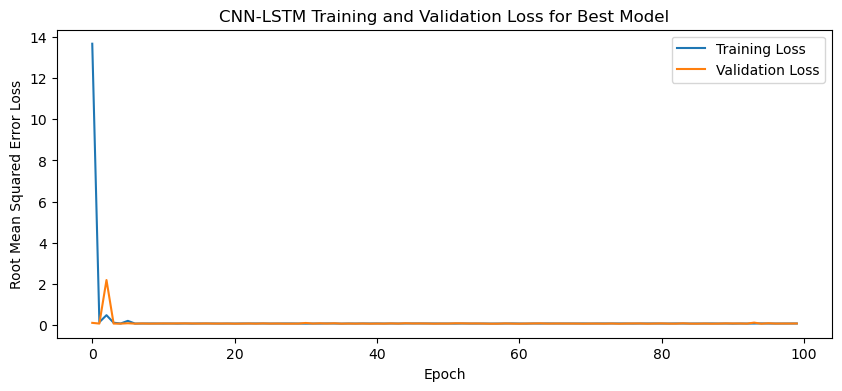

1/1 - 3s - loss: 0.0832 - 3s/epoch - 3s/step
Test Loss: 0.08317094296216965


NameError: name 'make_forecasts' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    #print("Forecasts:")
    #print(forecasts)
    #print("Actual:")
    #print(actual)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

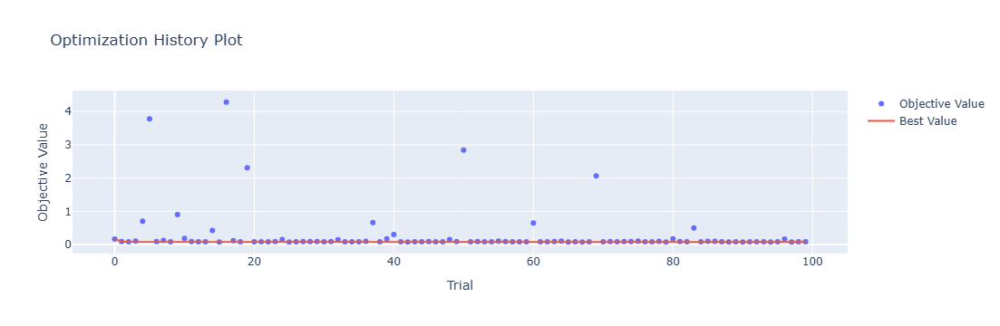

In [4]:
optuna.visualization.plot_optimization_history(study)

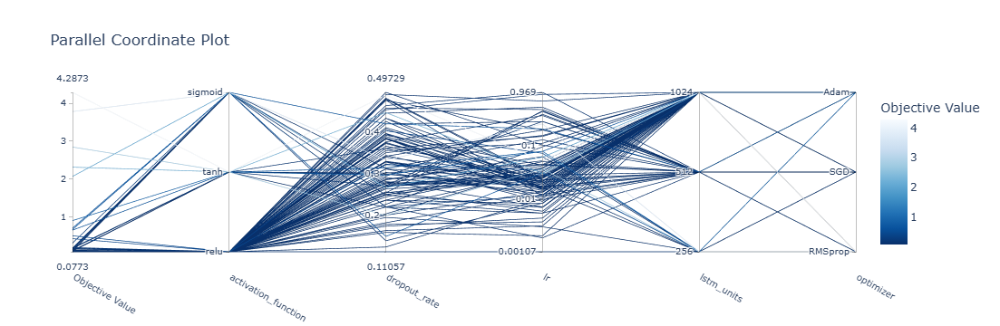

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

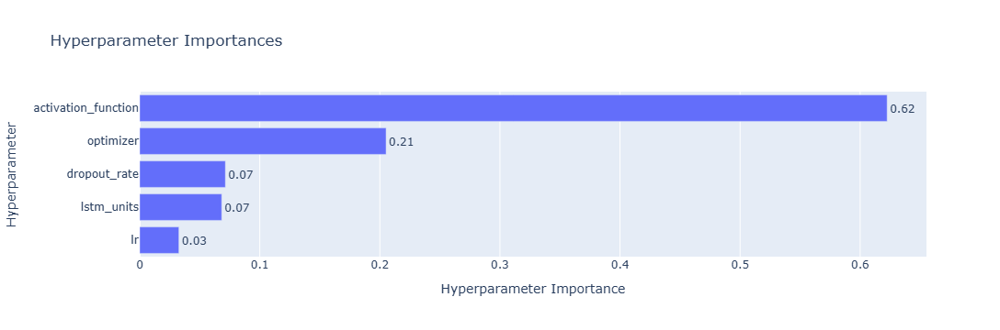

In [6]:
optuna.visualization.plot_param_importances(study)

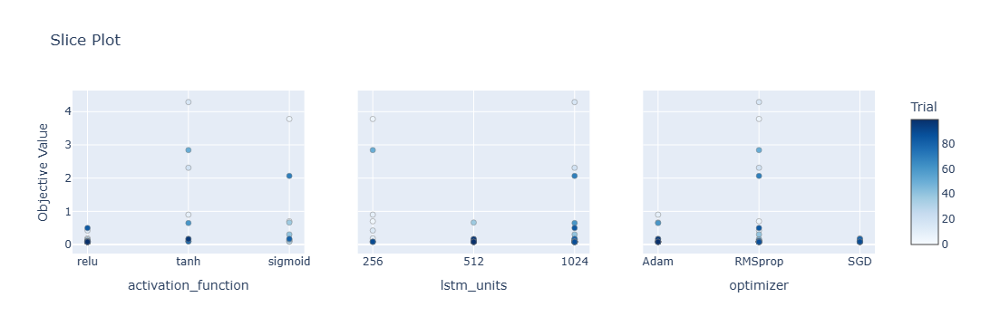

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

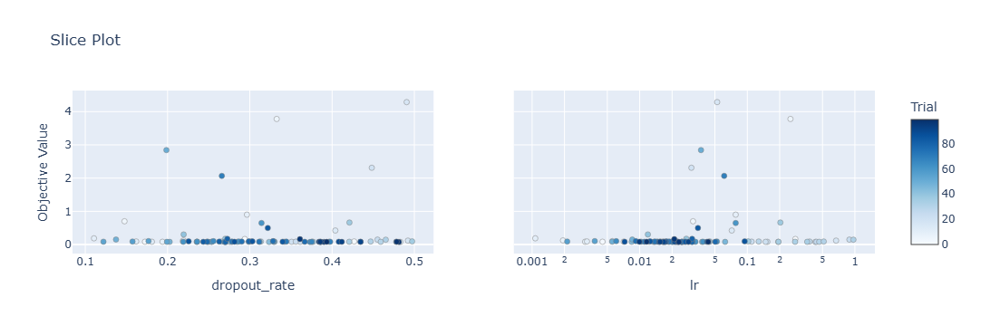

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 44s 252ms/step - loss: 17.1317 - accuracy: 0.5952 - mae: 16.8957 - rmse: 17.1317 - mape: 3368.1340 - pearson: 0.6394 - val_loss: 0.1206 - val_accuracy: 0.0000e+00 - val_mae: 0.1030 - val_rmse: 0.1206 - val_mape: 22.7452 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 15s 183ms/step - loss: 0.3752 - accuracy: 0.8571 - mae: 0.3255 - rmse: 0.3752 - mape: 59.3332 - pearson: 0.8002 - val_loss: 0.2767 - val_accuracy: 0.0000e+00 - val_mae: 0.2009 - val_rmse: 0.2767 - val_mape: 44.1323 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 19s 225ms/step - loss: 0.0959 - accuracy: 0.8929 - mae: 0.0840 - rmse: 0.0959 - mape: 15.6704 - pearson: 0.8623 - val_loss: 0.2094 - val_accuracy: 0.0000e+00 - val_mae: 0.1442 - val_rmse: 0.2094 - val_mape: 31.6817 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 19s 231ms/step - loss: 0.0890 - accuracy: 0.8929 - mae: 0.0772 - rmse: 0.0890 - m

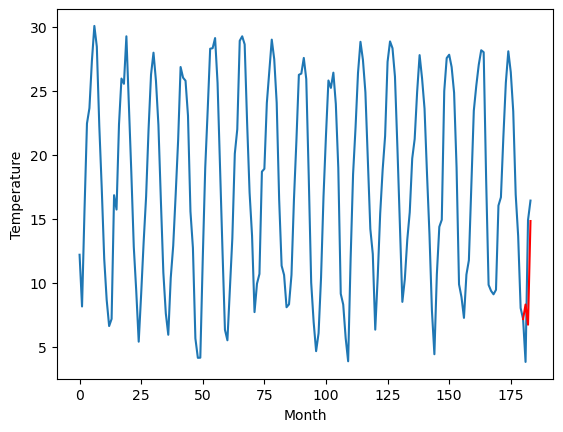

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		7.34		-1.19
8.44		5.77		-2.67
13.50		13.86		0.36
[180, 181, 182, 183]
[13.23, 7.34274923324585, 5.768031234741211, 13.863288040161134]


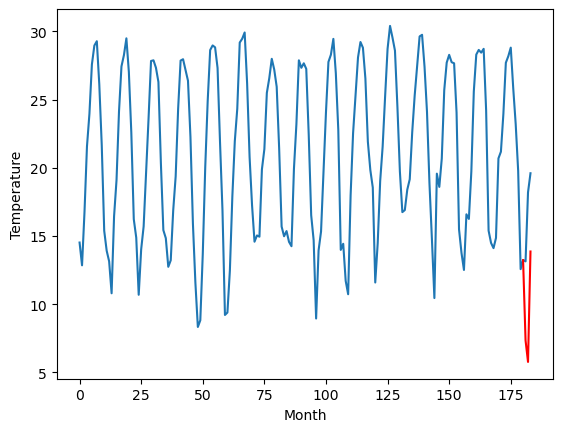

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.31		5.96		-1.35
8.17		4.39		-3.78
14.15		12.48		-1.67
[180, 181, 182, 183]
[7.18, 5.96274923324585, 4.388031234741211, 12.483288040161133]


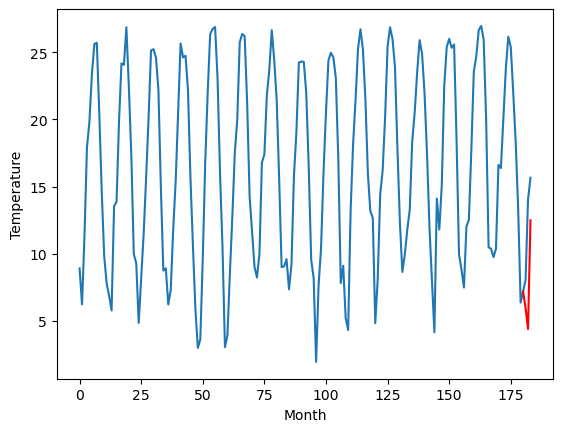

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.38		4.76		-0.62
3.81		3.19		-0.62
11.72		11.28		-0.44
[180, 181, 182, 183]
[11.46, 4.76274923324585, 3.188031234741211, 11.283288040161132]


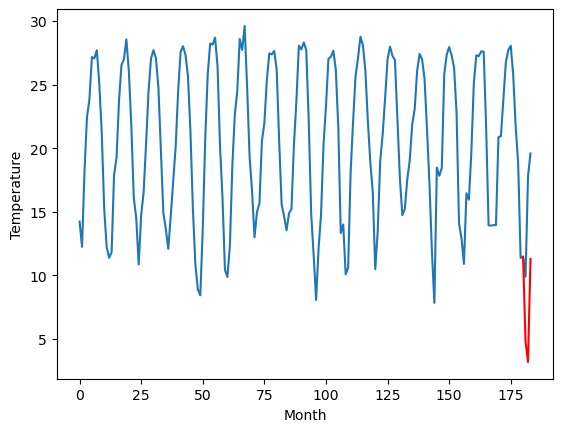

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.33		11.68		0.35
8.24		10.11		1.87
18.14		18.20		0.06
[180, 181, 182, 183]
[9.27, 11.68274923324585, 10.108031234741212, 18.203288040161134]


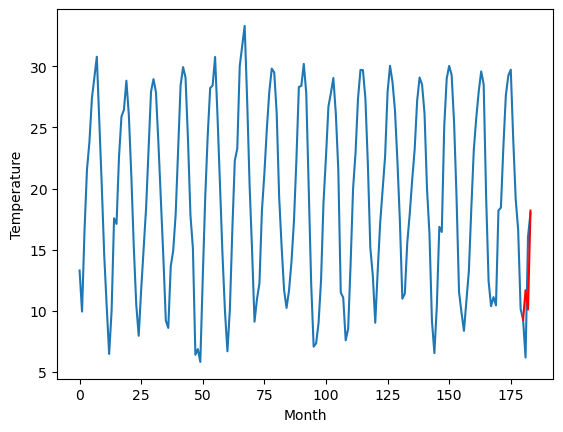

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.74		13.99		1.25
13.39		12.42		-0.97
18.29		20.51		2.22
[180, 181, 182, 183]
[7.77, 13.99274923324585, 12.41803123474121, 20.513288040161132]


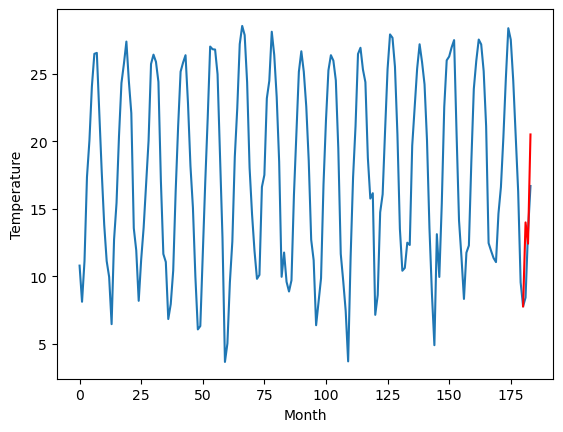

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.33		8.38		0.05
8.97		6.81		-2.16
15.95		14.90		-1.05
[180, 181, 182, 183]
[6.59, 8.38274923324585, 6.808031234741211, 14.903288040161133]


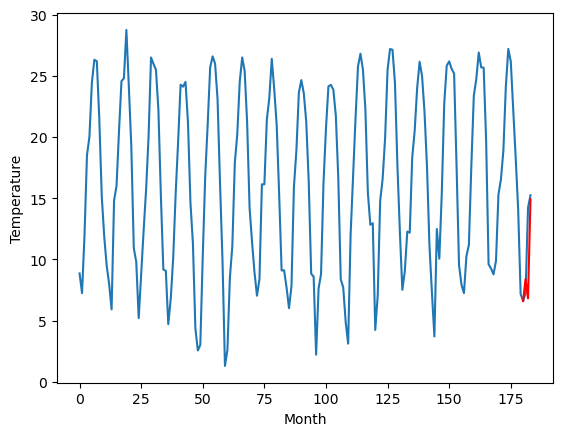

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.29		13.70		0.41
13.91		12.13		-1.78
20.43		20.22		-0.21
[180, 181, 182, 183]
[5.3, 13.70274923324585, 12.128031234741211, 20.223288040161133]


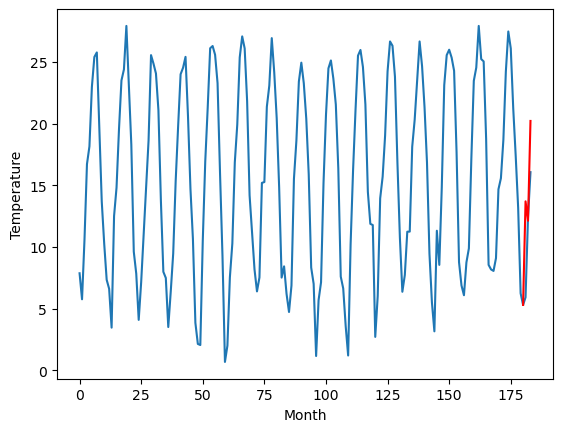

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.51		12.77		0.26
8.24		11.20		2.96
20.71		19.29		-1.42
[180, 181, 182, 183]
[3.1, 12.77274923324585, 11.198031234741212, 19.293288040161134]


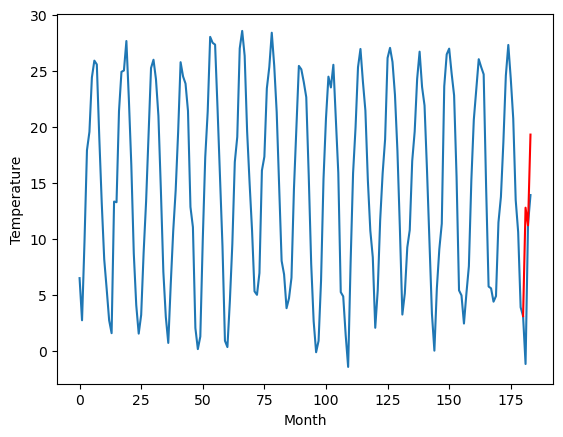

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.20		10.26		1.06
7.03		8.69		1.66
17.78		16.78		-1.00
[180, 181, 182, 183]
[0.6, 10.262749233245849, 8.68803123474121, 16.783288040161132]


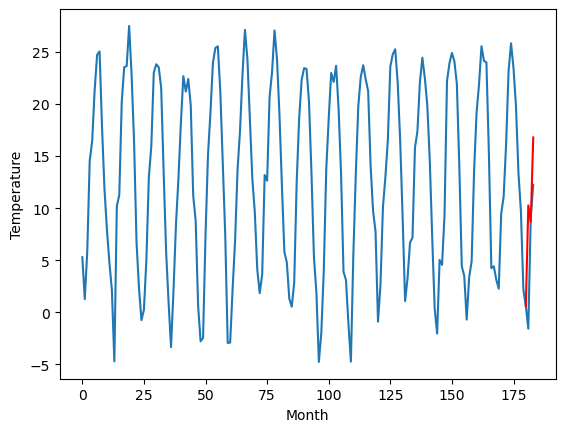

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.24		8.32		1.08
2.93		6.75		3.82
14.66		14.84		0.18
[180, 181, 182, 183]
[-0.75, 8.32274923324585, 6.748031234741211, 14.843288040161132]


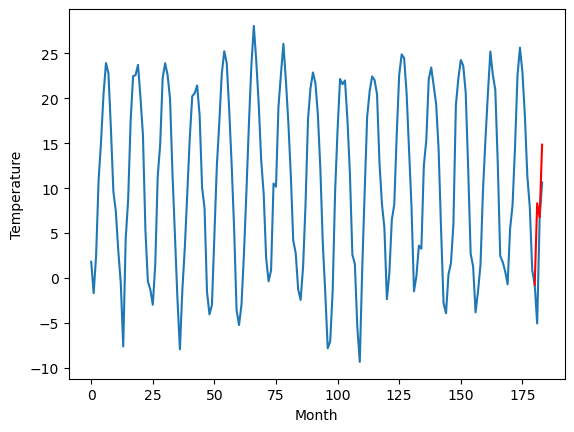

RangeIndex(start=1, stop=12, step=1)
[7.989999999999999, 8.53, 7.310000000000001, 5.3800000000000034, 11.33, 12.739999999999998, 8.33, 13.29, 12.51, 9.2, 7.24]
[8.32274923324585, 7.34274923324585, 5.96274923324585, 4.76274923324585, 11.68274923324585, 13.99274923324585, 8.38274923324585, 13.70274923324585, 12.77274923324585, 10.262749233245849, 8.32274923324585]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.99   8.322749
1                 1    8.53   7.342749
2                 2    7.31   5.962749
3                 3    5.38   4.762749
4                 4   11.33  11.682749
5                 5   12.74  13.992749
6                 6    8.33   8.382749
7                 7   13.29  13.702749
8                 8   12.51  12.772749
9                 9    9.20  10.262749
10               10    7.24   8.322749


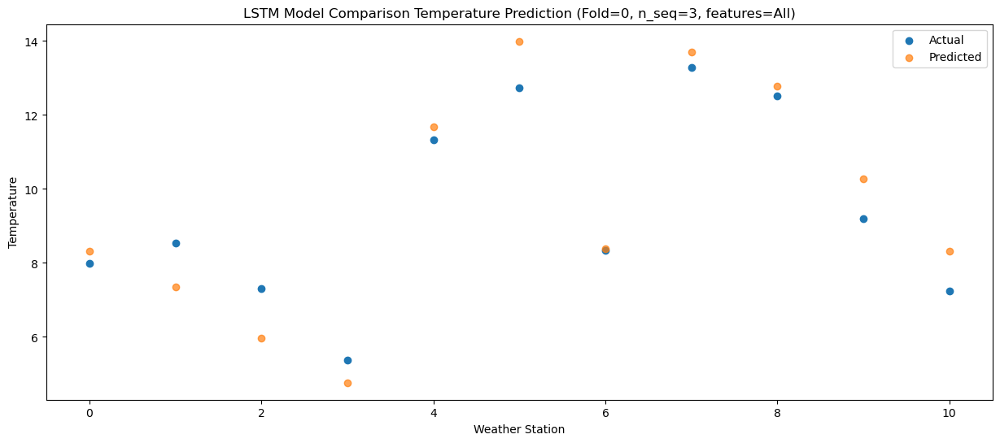

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.64   6.748031
1                 1    8.44   5.768031
2                 2    8.17   4.388031
3                 3    3.81   3.188031
4                 4    8.24  10.108031
5                 5   13.39  12.418031
6                 6    8.97   6.808031
7                 7   13.91  12.128031
8                 8    8.24  11.198031
9                 9    7.03   8.688031
10               10    2.93   6.748031


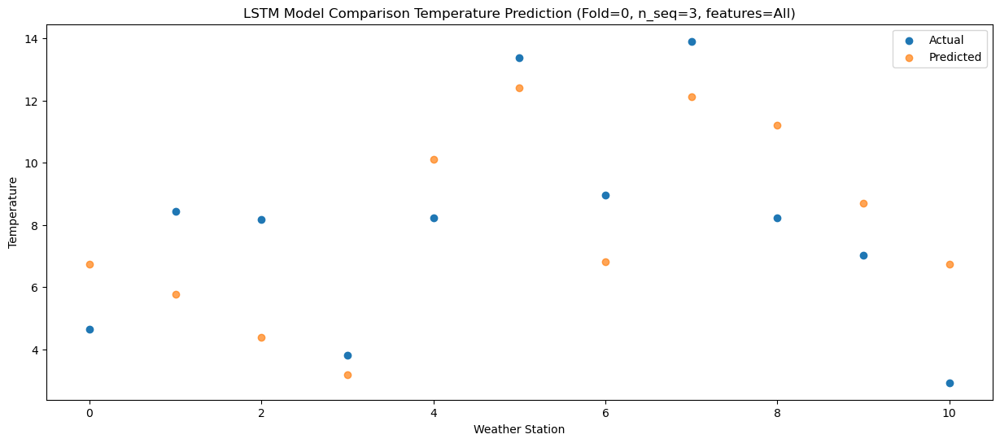

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.71  14.843288
1                 1   13.50  13.863288
2                 2   14.15  12.483288
3                 3   11.72  11.283288
4                 4   18.14  18.203288
5                 5   18.29  20.513288
6                 6   15.95  14.903288
7                 7   20.43  20.223288
8                 8   20.71  19.293288
9                 9   17.78  16.783288
10               10   14.66  14.843288


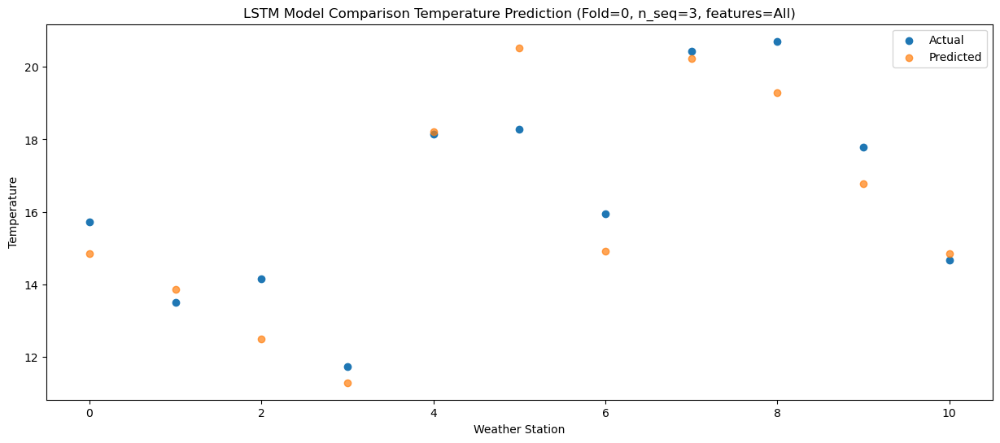

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (1, 1, 1024)              12996608  
                                                                 
 dropout (Dropout)           (1, 1, 1024)              0         
                                                                 
 lstm_1 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_1 (Dropout)         (1, 1024)                 0         
                                                                 
 dense (Dense)               (1, 256)                  262400    
                                                                 
 dense_1 (Dense)             (1, 128)                  32896     
                                                                 
 dense_2 (Dense)             (1, 3)                    3

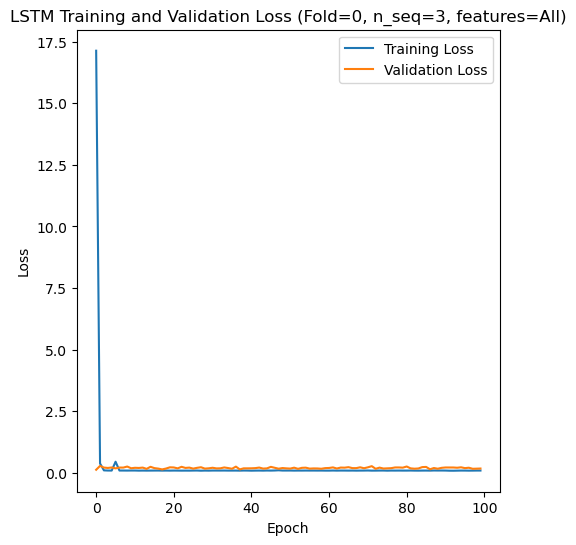

Epoch 1/100
84/84 [==============================] - 59s 359ms/step - loss: 19.5350 - accuracy: 0.7500 - mae: 19.1757 - rmse: 19.5350 - mape: 4239.7568 - pearson: 0.7143 - val_loss: 0.1231 - val_accuracy: 0.0000e+00 - val_mae: 0.1006 - val_rmse: 0.1231 - val_mape: 21.5581 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 23s 273ms/step - loss: 0.6319 - accuracy: 0.8571 - mae: 0.5707 - rmse: 0.6319 - mape: 106.2846 - pearson: 0.8071 - val_loss: 0.1982 - val_accuracy: 0.0000e+00 - val_mae: 0.1502 - val_rmse: 0.1982 - val_mape: 32.0987 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 23s 275ms/step - loss: 0.0944 - accuracy: 0.9048 - mae: 0.0820 - rmse: 0.0944 - mape: 15.2679 - pearson: 0.8762 - val_loss: 0.2776 - val_accuracy: 0.0000e+00 - val_mae: 0.2036 - val_rmse: 0.2776 - val_mape: 43.4820 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 23s 275ms/step - loss: 0.1165 - accuracy: 0.9048 - mae: 0.0983 - rmse: 0.1165 - 

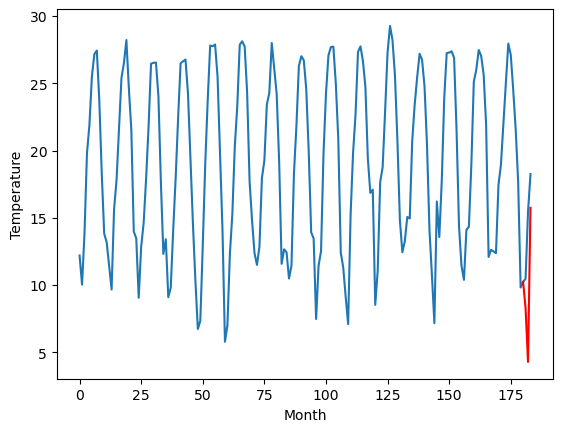

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.49		6.89		-0.60
8.15		2.86		-5.29
14.92		14.31		-0.61
[180, 181, 182, 183]
[6.41, 6.885577263832093, 2.859901013374329, 14.308318676948549]


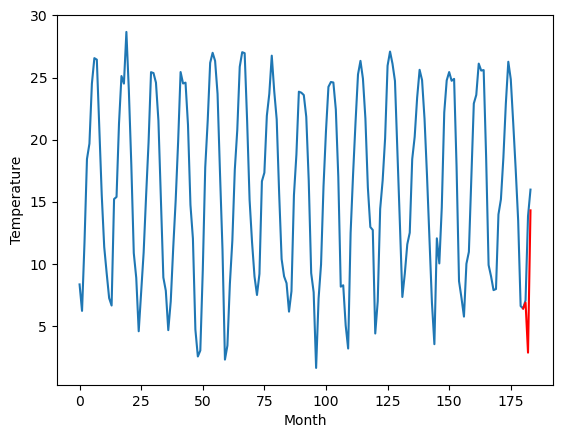

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.35		8.13		-1.22
9.84		4.10		-5.74
16.90		15.55		-1.35
[180, 181, 182, 183]
[7.6, 8.125577263832092, 4.099901013374328, 15.548318676948547]


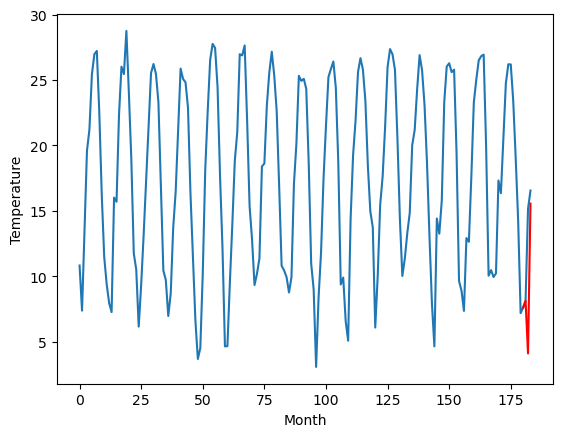

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.86		7.16		-0.70
6.27		3.13		-3.14
13.64		14.58		0.94
[180, 181, 182, 183]
[11.89, 7.155577263832092, 3.1299010133743286, 14.578318676948548]


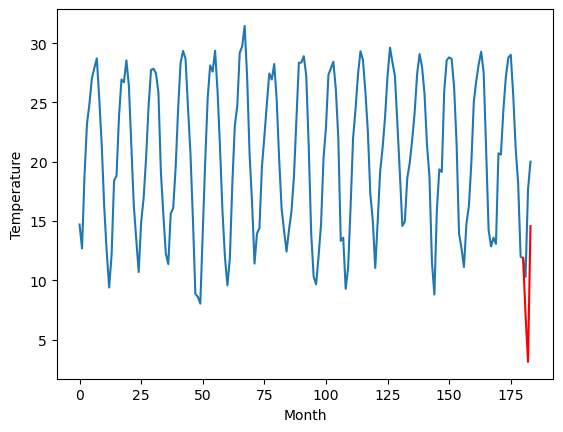

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.19		11.40		-0.79
10.49		7.37		-3.12
18.10		18.82		0.72
[180, 181, 182, 183]
[10.96, 11.395577263832092, 7.369901013374328, 18.818318676948547]


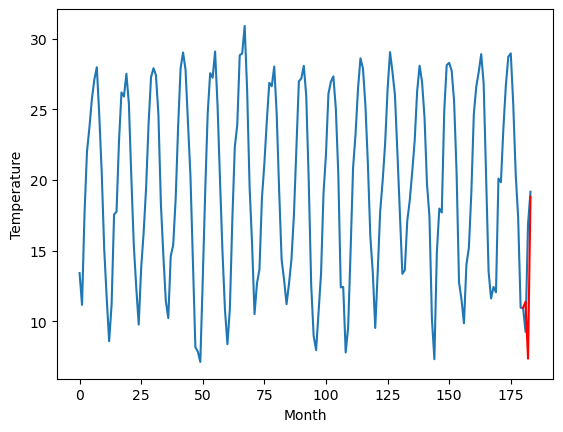

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.84		7.55		0.71
7.22		3.52		-3.70
14.56		14.97		0.41
[180, 181, 182, 183]
[7.75, 7.545577263832092, 3.5199010133743283, 14.968318676948547]


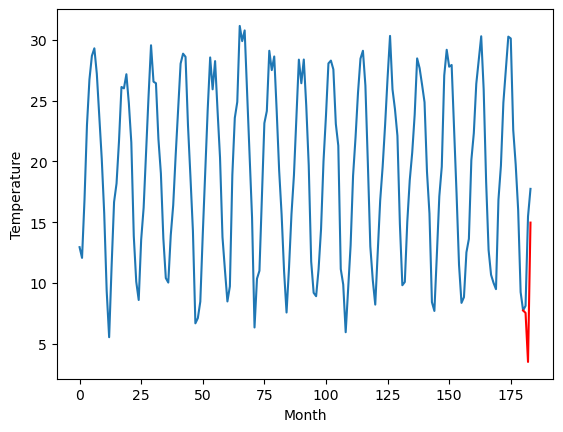

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.62		10.02		-0.60
11.40		5.99		-5.41
17.68		17.44		-0.24
[180, 181, 182, 183]
[6.17, 10.015577263832093, 5.989901013374329, 17.438318676948548]


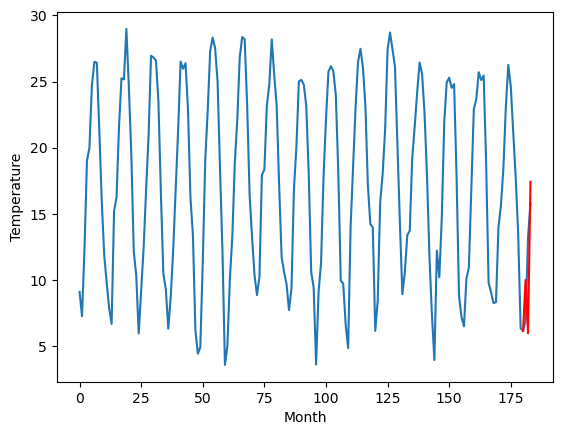

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.40		13.91		-0.49
11.40		9.88		-1.52
22.72		21.33		-1.39
[180, 181, 182, 183]
[4.57, 13.905577263832093, 9.87990101337433, 21.328318676948548]


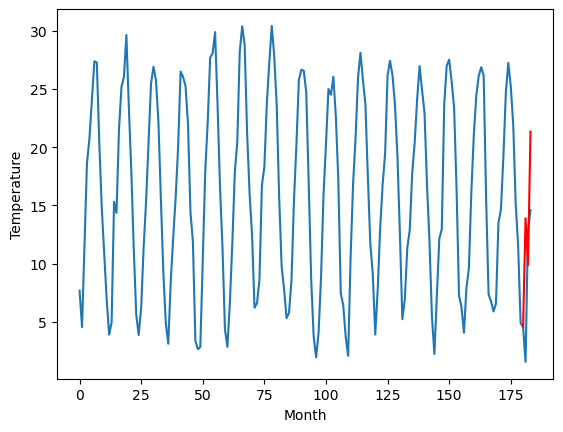

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.07		12.62		-0.45
8.29		8.59		0.30
20.85		20.04		-0.81
[180, 181, 182, 183]
[5.46, 12.615577263832092, 8.589901013374329, 20.03831867694855]


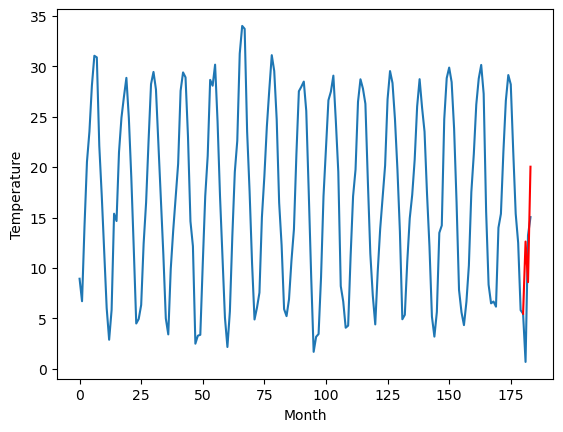

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.06		12.15		-0.91
8.69		8.12		-0.57
19.40		19.57		0.17
[180, 181, 182, 183]
[5.42, 12.145577263832092, 8.119901013374328, 19.568318676948547]


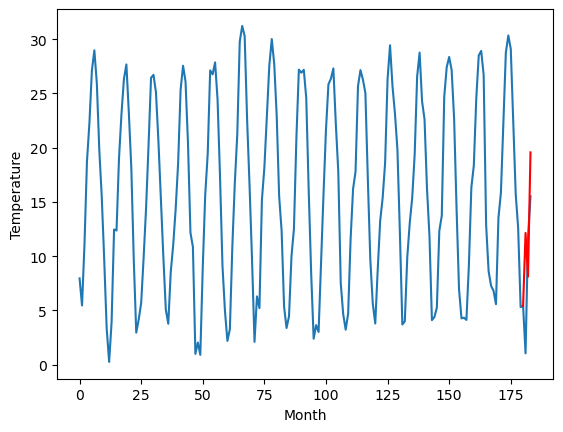

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.28		8.32		1.04
6.32		4.29		-2.03
13.54		15.74		2.20
[180, 181, 182, 183]
[2.17, 8.315577263832092, 4.289901013374328, 15.738318676948547]


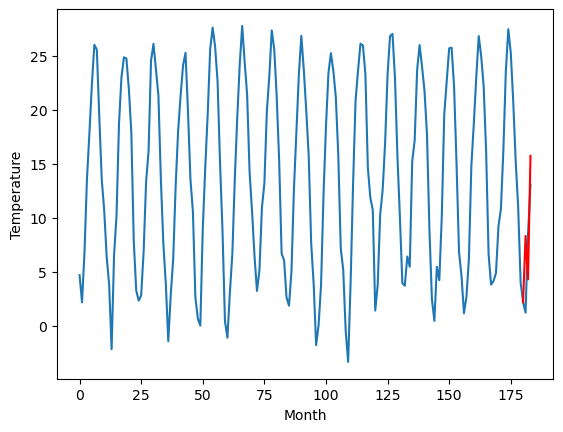

RangeIndex(start=1, stop=12, step=1)
[9.54, 7.489999999999999, 9.35, 7.859999999999999, 12.189999999999998, 6.84, 10.62, 14.4, 13.07, 13.06, 7.279999999999999]
[8.315577263832092, 6.885577263832093, 8.125577263832092, 7.155577263832092, 11.395577263832092, 7.545577263832092, 10.015577263832093, 13.905577263832093, 12.615577263832092, 12.145577263832092, 8.315577263832092]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    9.54   8.315577
1                 1    7.49   6.885577
2                 2    9.35   8.125577
3                 3    7.86   7.155577
4                 4   12.19  11.395577
5                 5    6.84   7.545577
6                 6   10.62  10.015577
7                 7   14.40  13.905577
8                 8   13.07  12.615577
9                 9   13.06  12.145577
10               10    7.28   8.315577


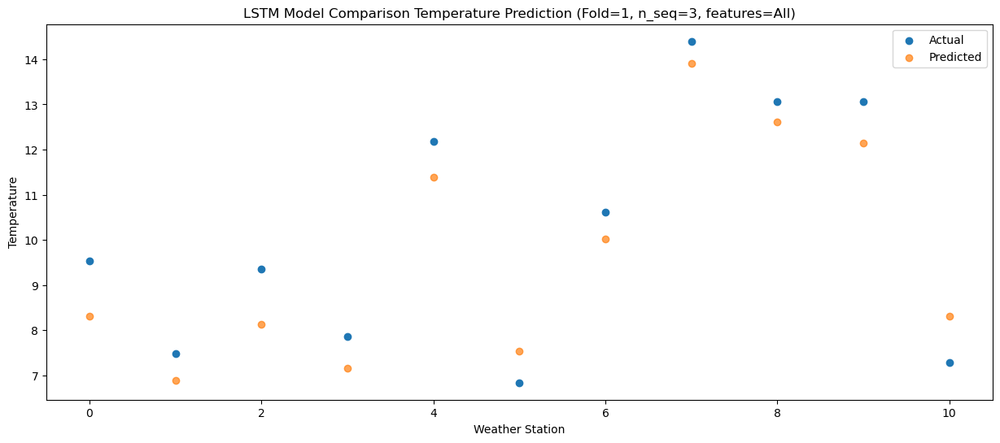

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    9.76   4.289901
1                 1    8.15   2.859901
2                 2    9.84   4.099901
3                 3    6.27   3.129901
4                 4   10.49   7.369901
5                 5    7.22   3.519901
6                 6   11.40   5.989901
7                 7   11.40   9.879901
8                 8    8.29   8.589901
9                 9    8.69   8.119901
10               10    6.32   4.289901


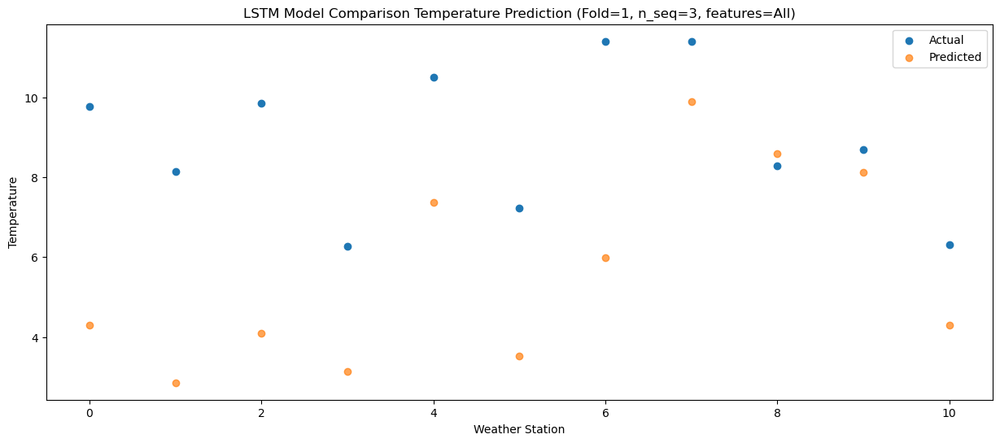

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   14.74  15.738319
1                 1   14.92  14.308319
2                 2   16.90  15.548319
3                 3   13.64  14.578319
4                 4   18.10  18.818319
5                 5   14.56  14.968319
6                 6   17.68  17.438319
7                 7   22.72  21.328319
8                 8   20.85  20.038319
9                 9   19.40  19.568319
10               10   13.54  15.738319


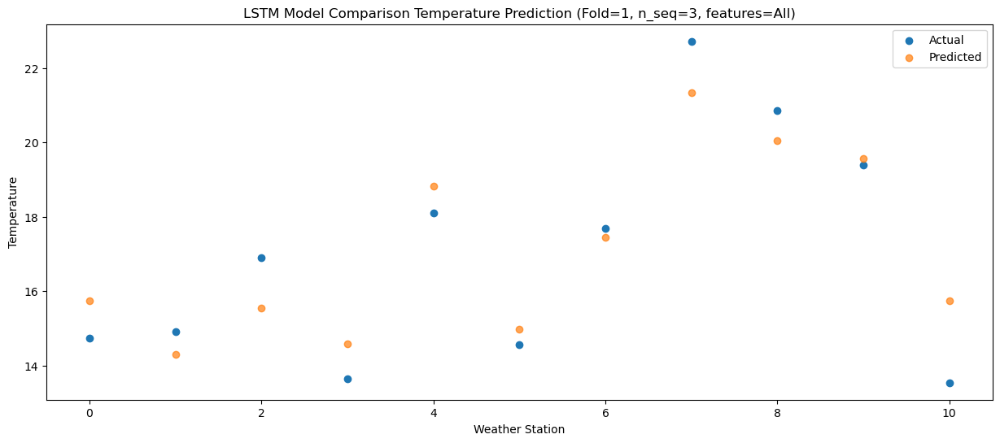

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (1, 1, 1024)              12996608  
                                                                 
 dropout_2 (Dropout)         (1, 1, 1024)              0         
                                                                 
 lstm_3 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_3 (Dropout)         (1, 1024)                 0         
                                                                 
 dense_3 (Dense)             (1, 256)                  262400    
                                                                 
 dense_4 (Dense)             (1, 128)                  32896     
                                                                 
 dense_5 (Dense)             (1, 3)                   

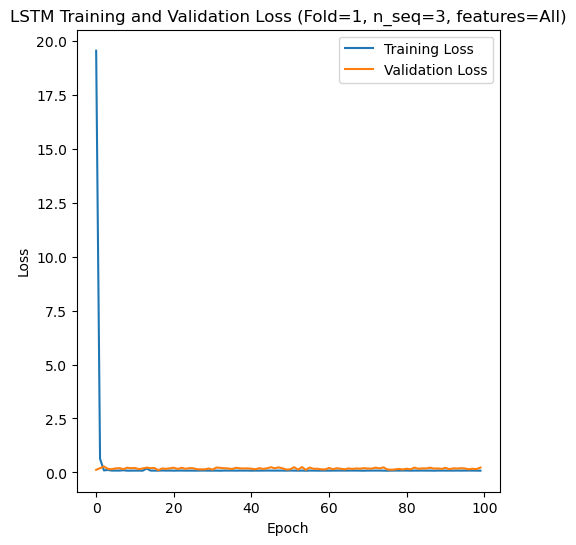

Epoch 1/100
84/84 [==============================] - 44s 242ms/step - loss: 21.0904 - accuracy: 0.7976 - mae: 20.7398 - rmse: 21.0904 - mape: 3648.9382 - pearson: 0.7735 - val_loss: 0.2690 - val_accuracy: 0.0000e+00 - val_mae: 0.1687 - val_rmse: 0.2690 - val_mape: 37.7979 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 14s 165ms/step - loss: 0.2336 - accuracy: 0.8929 - mae: 0.1842 - rmse: 0.2336 - mape: 32.5911 - pearson: 0.8729 - val_loss: 0.1497 - val_accuracy: 0.0000e+00 - val_mae: 0.1058 - val_rmse: 0.1497 - val_mape: 23.7613 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 15s 181ms/step - loss: 0.1683 - accuracy: 0.9048 - mae: 0.1453 - rmse: 0.1683 - mape: 27.0013 - pearson: 0.8734 - val_loss: 0.2285 - val_accuracy: 0.0000e+00 - val_mae: 0.1503 - val_rmse: 0.2285 - val_mape: 33.7014 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 18s 216ms/step - loss: 0.1339 - accuracy: 0.9167 - mae: 0.1190 - rmse: 0.1339 - m

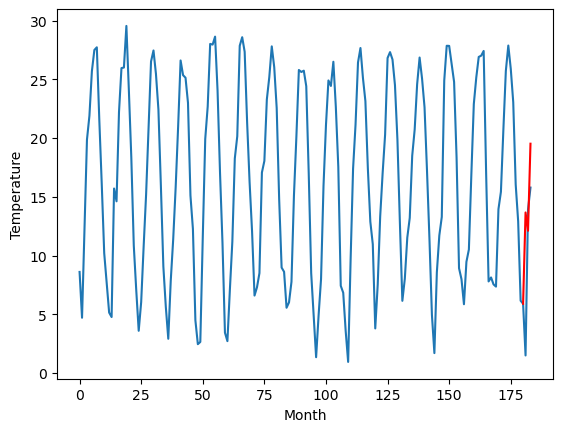

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.69		8.30		1.61
2.65		6.74		4.09
12.84		14.16		1.32
[180, 181, 182, 183]
[2.63, 8.3024547290802, 6.743024129867553, 14.155050058364868]


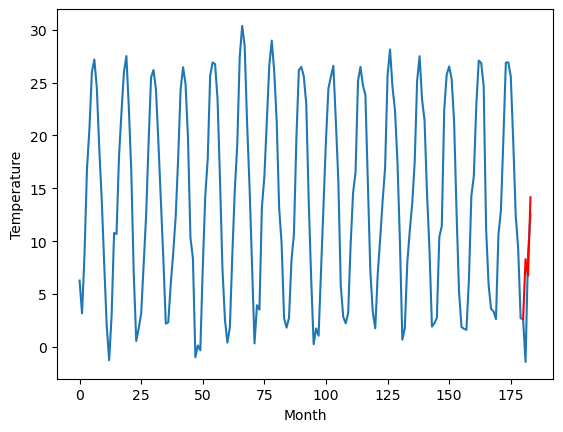

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.70		13.57		0.87
15.43		12.01		-3.42
17.24		19.43		2.19
[180, 181, 182, 183]
[16.55, 13.5724547290802, 12.013024129867553, 19.425050058364867]


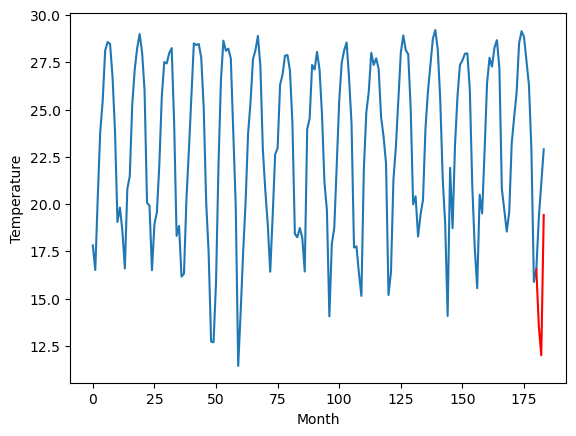

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.49		10.10		4.61
5.51		8.54		3.03
9.62		15.96		6.34
[180, 181, 182, 183]
[-0.83, 10.1024547290802, 8.543024129867554, 15.955050058364868]


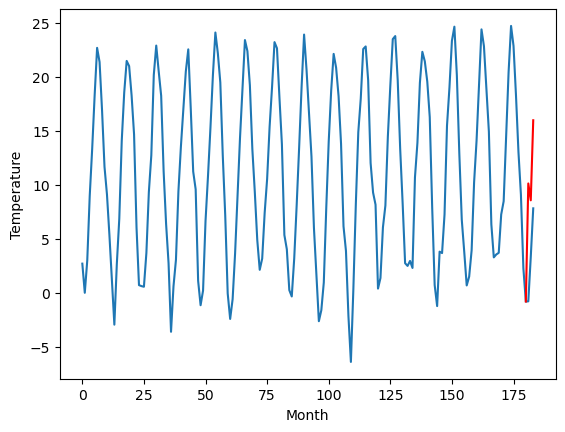

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.96		10.14		1.18
8.22		8.58		0.36
15.55		16.00		0.45
[180, 181, 182, 183]
[11.52, 10.1424547290802, 8.583024129867553, 15.995050058364868]


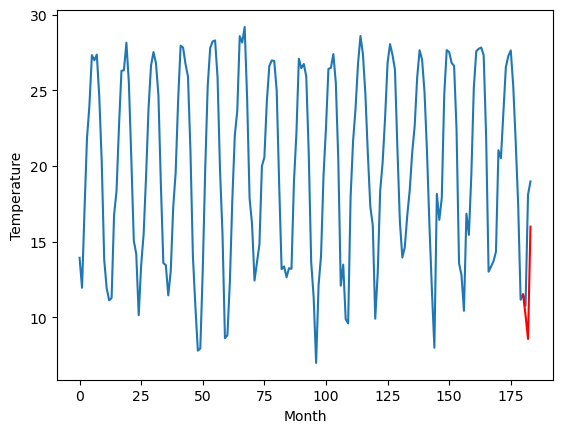

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.69		7.81		2.12
3.34		6.25		2.91
11.72		13.67		1.95
[180, 181, 182, 183]
[11.47, 7.8124547290802, 6.253024129867554, 13.66505005836487]


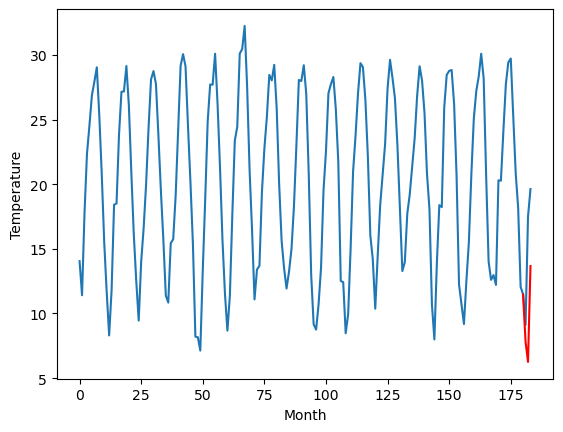

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
17.12		19.35		2.23
14.01		17.79		3.78
24.38		25.21		0.83
[180, 181, 182, 183]
[7.75, 19.3524547290802, 17.793024129867554, 25.20505005836487]


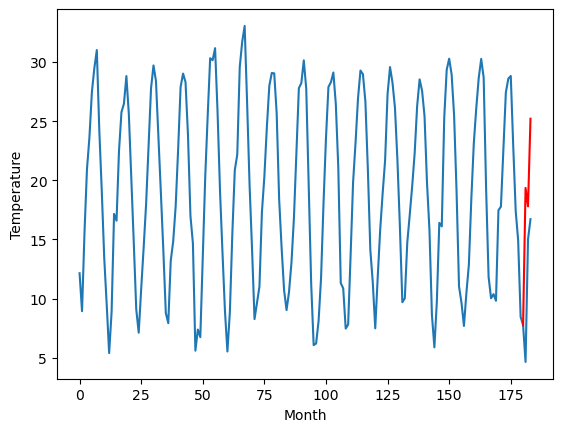

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.22		4.21		0.99
6.14		2.65		-3.49
9.24		10.07		0.83
[180, 181, 182, 183]
[4.9, 4.2124547290802, 2.6530241298675534, 10.065050058364868]


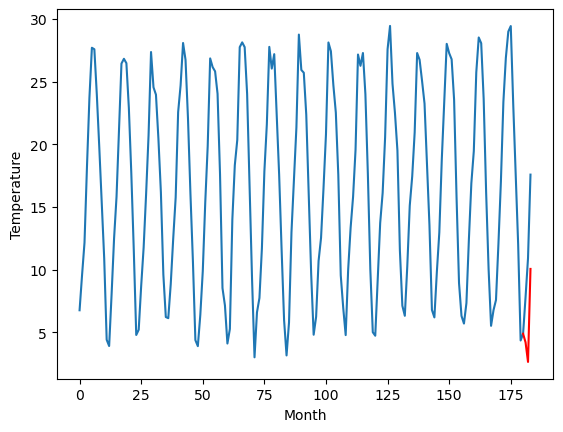

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.88		15.47		1.59
12.96		13.91		0.95
12.56		21.33		8.77
[180, 181, 182, 183]
[14.14, 15.4724547290802, 13.913024129867553, 21.325050058364866]


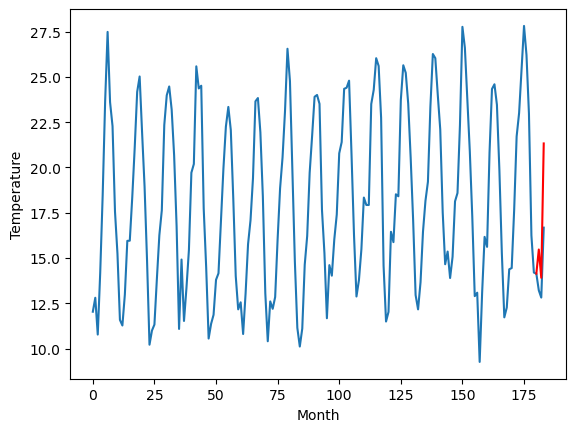

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.64		15.58		1.94
14.14		14.02		-0.12
21.02		21.44		0.42
[180, 181, 182, 183]
[5.55, 15.582454729080201, 14.023024129867554, 21.43505005836487]


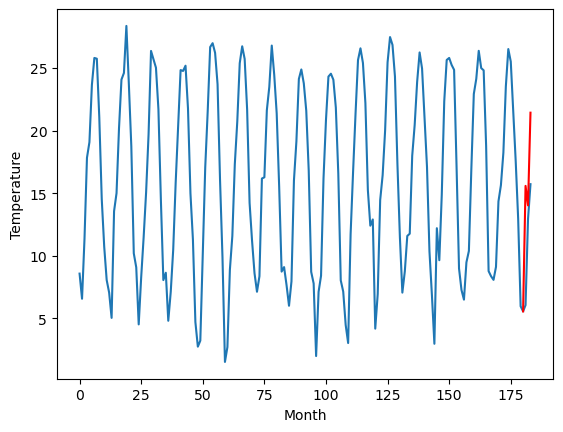

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.47		13.67		1.20
13.82		12.11		-1.71
20.03		19.53		-0.50
[180, 181, 182, 183]
[3.19, 13.6724547290802, 12.113024129867554, 19.52505005836487]


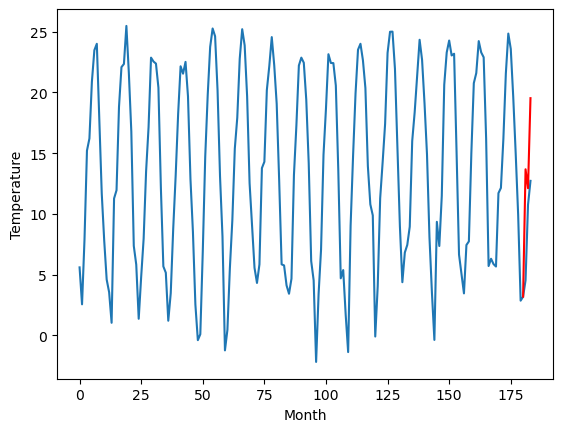

RangeIndex(start=1, stop=12, step=1)
[11.88, 6.69, 12.7, 5.490000000000001, 8.96, 5.69, 17.12, 3.2200000000000015, 13.880000000000003, 13.64, 12.47]
[13.6724547290802, 8.3024547290802, 13.5724547290802, 10.1024547290802, 10.1424547290802, 7.8124547290802, 19.3524547290802, 4.2124547290802, 15.4724547290802, 15.582454729080201, 13.6724547290802]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   11.88  13.672455
1                 1    6.69   8.302455
2                 2   12.70  13.572455
3                 3    5.49  10.102455
4                 4    8.96  10.142455
5                 5    5.69   7.812455
6                 6   17.12  19.352455
7                 7    3.22   4.212455
8                 8   13.88  15.472455
9                 9   13.64  15.582455
10               10   12.47  13.672455


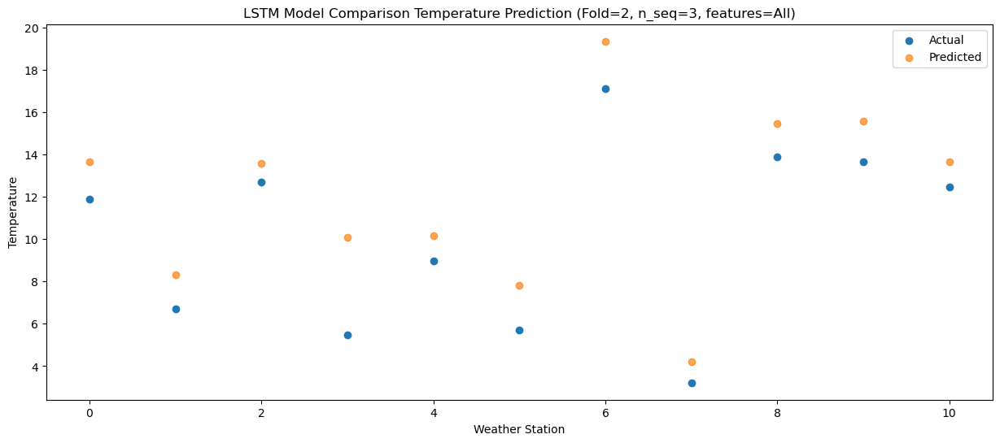

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    7.48  12.113024
1                 1    2.65   6.743024
2                 2   15.43  12.013024
3                 3    5.51   8.543024
4                 4    8.22   8.583024
5                 5    3.34   6.253024
6                 6   14.01  17.793024
7                 7    6.14   2.653024
8                 8   12.96  13.913024
9                 9   14.14  14.023024
10               10   13.82  12.113024


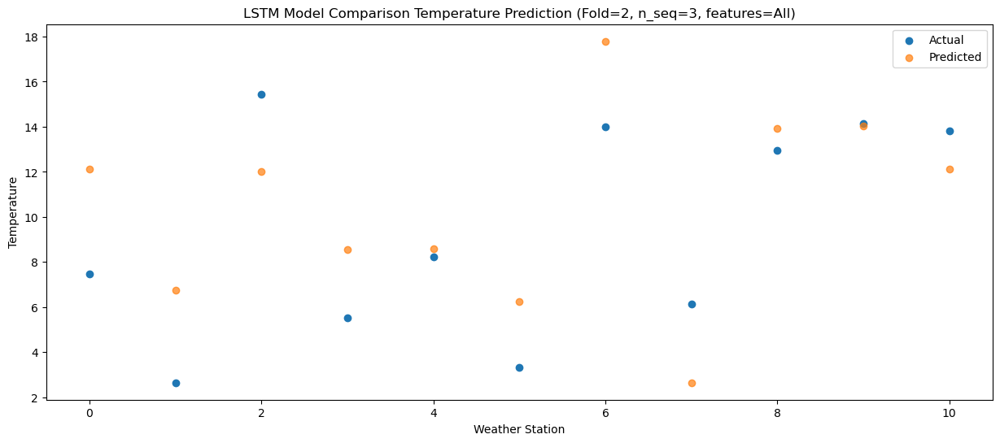

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   19.90   19.52505
1                 1   12.84   14.15505
2                 2   17.24   19.42505
3                 3    9.62   15.95505
4                 4   15.55   15.99505
5                 5   11.72   13.66505
6                 6   24.38   25.20505
7                 7    9.24   10.06505
8                 8   12.56   21.32505
9                 9   21.02   21.43505
10               10   20.03   19.52505


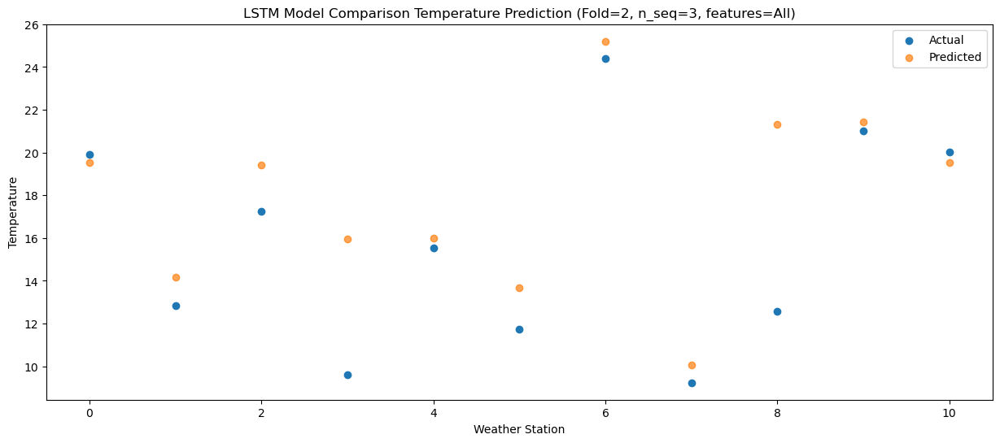

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (1, 1, 1024)              12996608  
                                                                 
 dropout_4 (Dropout)         (1, 1, 1024)              0         
                                                                 
 lstm_5 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_5 (Dropout)         (1, 1024)                 0         
                                                                 
 dense_6 (Dense)             (1, 256)                  262400    
                                                                 
 dense_7 (Dense)             (1, 128)                  32896     
                                                                 
 dense_8 (Dense)             (1, 3)                   

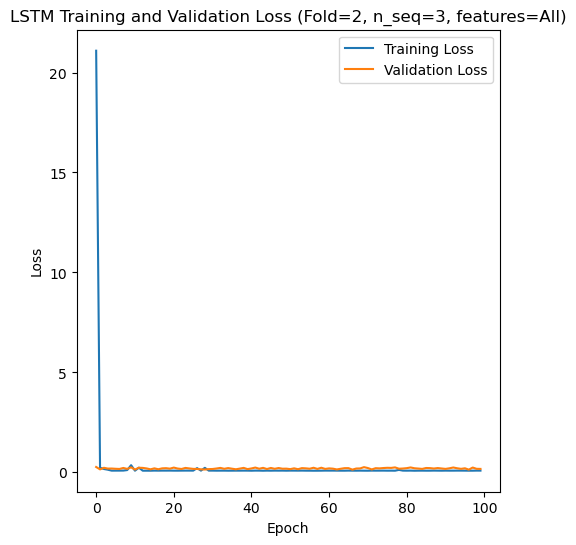

Epoch 1/100
84/84 [==============================] - 44s 234ms/step - loss: 16.3454 - accuracy: 0.7738 - mae: 16.0793 - rmse: 16.3454 - mape: 3403.6626 - pearson: 0.8431 - val_loss: 0.1348 - val_accuracy: 0.0000e+00 - val_mae: 0.1057 - val_rmse: 0.1348 - val_mape: 23.2063 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 14s 165ms/step - loss: 0.2965 - accuracy: 0.9048 - mae: 0.2481 - rmse: 0.2965 - mape: 45.1773 - pearson: 0.8233 - val_loss: 0.1471 - val_accuracy: 0.0000e+00 - val_mae: 0.1074 - val_rmse: 0.1471 - val_mape: 23.6198 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 14s 172ms/step - loss: 0.1791 - accuracy: 0.9405 - mae: 0.1568 - rmse: 0.1791 - mape: 31.9125 - pearson: 0.8945 - val_loss: 0.1511 - val_accuracy: 0.0000e+00 - val_mae: 0.1186 - val_rmse: 0.1511 - val_mape: 26.6595 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 14s 167ms/step - loss: 0.2073 - accuracy: 0.9405 - mae: 0.1904 - rmse: 0.2073 - m

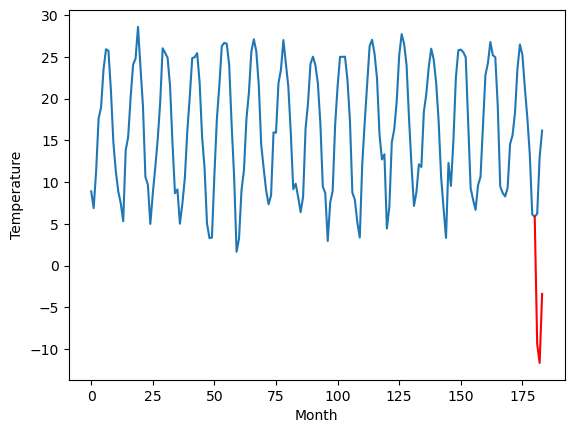

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.42		8.42		-0.00
4.70		6.14		1.44
16.67		14.41		-2.26
[180, 181, 182, 183]
[3.2, 8.417918033599854, 6.141024894714356, 14.413276977539063]


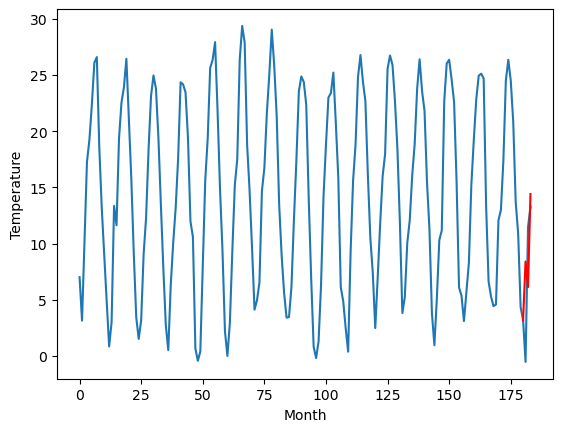

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.30		7.89		-2.41
12.60		5.61		-6.99
13.75		13.88		0.13
[180, 181, 182, 183]
[8.48, 7.887918033599853, 5.611024894714355, 13.883276977539062]


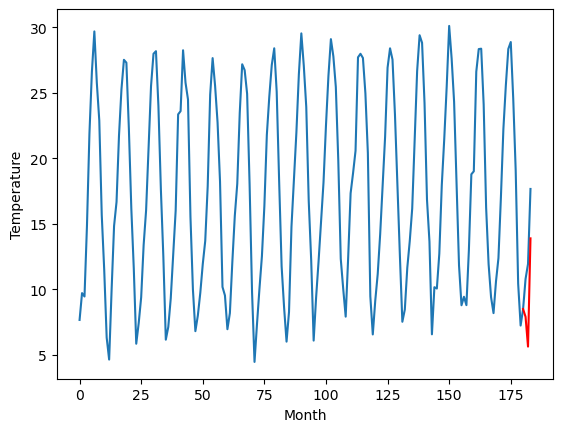

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.74		2.05		0.31
0.42		-0.23		-0.65
10.63		8.04		-2.59
[180, 181, 182, 183]
[1.55, 2.0479180335998537, -0.22897510528564435, 8.043276977539062]


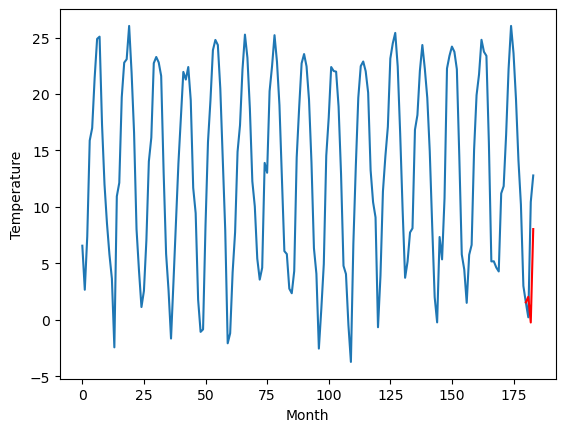

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.43		7.75		0.32
3.56		5.47		1.91
16.64		13.74		-2.90
[180, 181, 182, 183]
[1.08, 7.747918033599854, 5.471024894714356, 13.743276977539063]


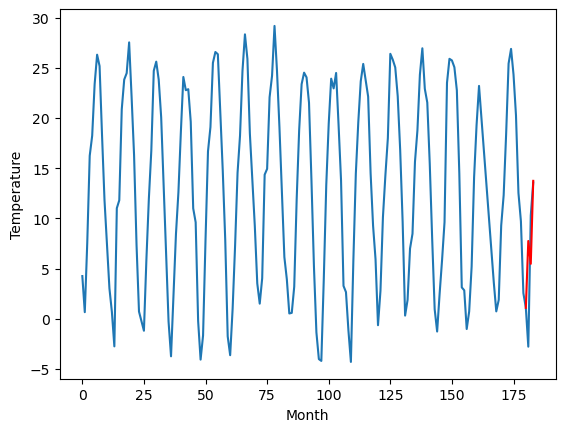

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.57		5.87		0.30
2.85		3.59		0.74
14.18		11.86		-2.32
[180, 181, 182, 183]
[0.21, 5.867918033599853, 3.591024894714355, 11.863276977539062]


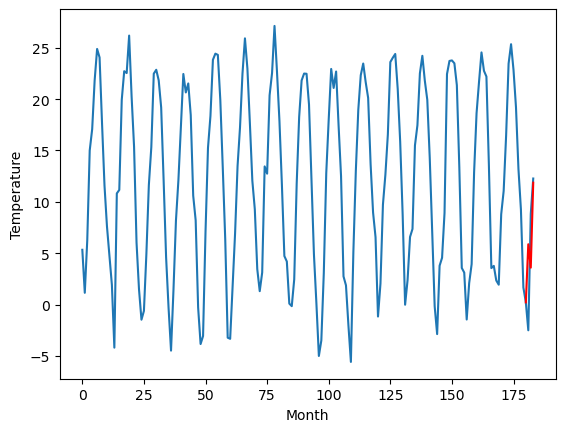

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.92		6.50		-1.42
8.02		4.22		-3.80
10.99		12.49		1.50
[180, 181, 182, 183]
[-8.22, 6.497918033599854, 4.221024894714356, 12.493276977539063]


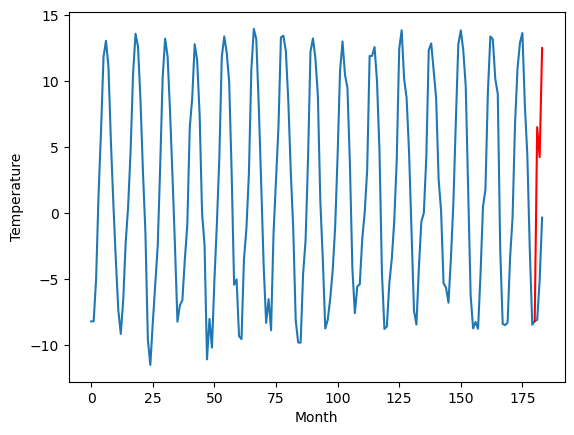

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.12		5.42		-1.70
9.97		3.14		-6.83
11.57		11.41		-0.16
[180, 181, 182, 183]
[10.04, 5.417918033599854, 3.1410248947143558, 11.413276977539063]


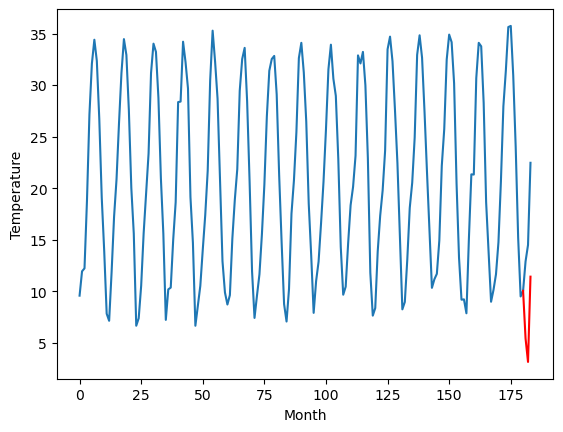

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.47		3.10		-2.37
6.40		0.82		-5.58
6.18		9.09		2.91
[180, 181, 182, 183]
[9.17, 3.0979180335998535, 0.8210248947143555, 9.093276977539062]


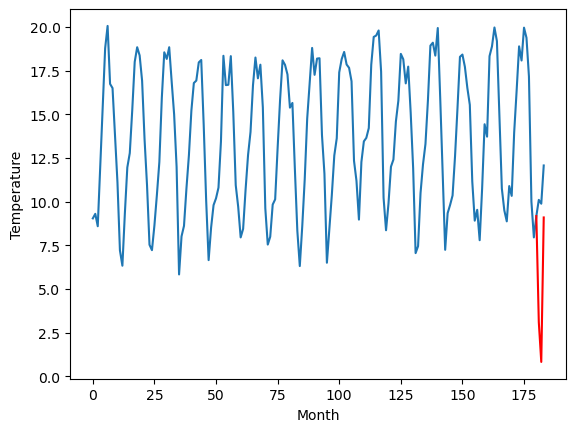

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.31		4.18		1.87
2.19		1.90		-0.29
7.19		10.17		2.98
[180, 181, 182, 183]
[0.94, 4.177918033599854, 1.9010248947143555, 10.173276977539063]


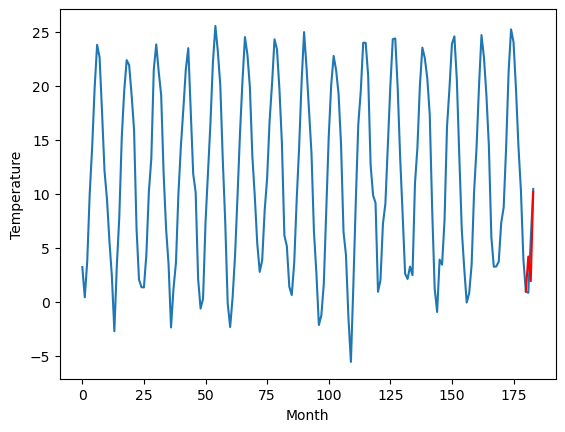

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-9.80		-9.39		0.41
-10.60		-11.67		-1.07
-3.41		-3.40		0.01
[180, 181, 182, 183]
[-0.13, -9.392081966400147, -11.668975105285645, -3.3967230224609377]


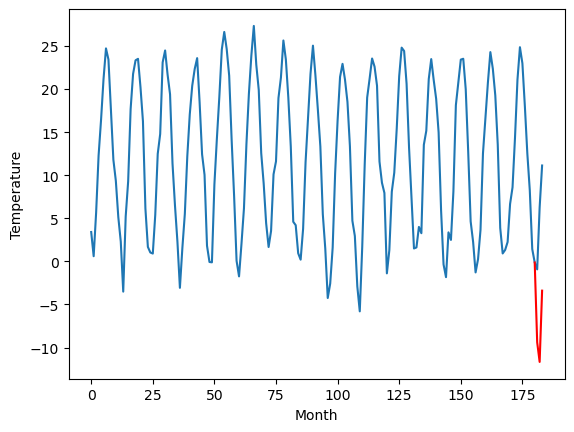

RangeIndex(start=1, stop=12, step=1)
[-8.520000000000001, 8.420000000000002, 10.299999999999999, 1.7399999999999998, 7.430000000000001, 5.5699999999999985, 7.92, 7.119999999999999, 5.4700000000000015, 2.3099999999999996, -9.8]
[-9.392081966400147, 8.417918033599854, 7.887918033599853, 2.0479180335998537, 7.747918033599854, 5.867918033599853, 6.497918033599854, 5.417918033599854, 3.0979180335998535, 4.177918033599854, -9.392081966400147]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   -8.52  -9.392082
1                 1    8.42   8.417918
2                 2   10.30   7.887918
3                 3    1.74   2.047918
4                 4    7.43   7.747918
5                 5    5.57   5.867918
6                 6    7.92   6.497918
7                 7    7.12   5.417918
8                 8    5.47   3.097918
9                 9    2.31   4.177918
10               10   -9.80  -9.392082


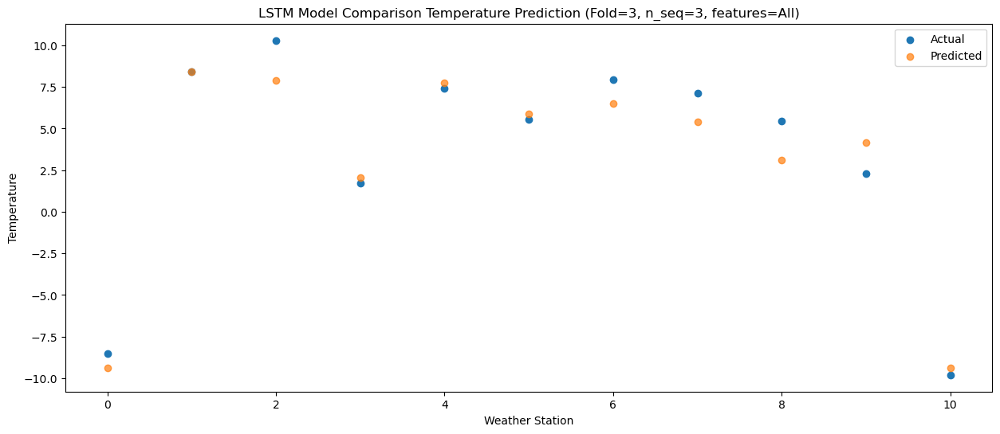

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -8.15 -11.668975
1                 1    4.70   6.141025
2                 2   12.60   5.611025
3                 3    0.42  -0.228975
4                 4    3.56   5.471025
5                 5    2.85   3.591025
6                 6    8.02   4.221025
7                 7    9.97   3.141025
8                 8    6.40   0.821025
9                 9    2.19   1.901025
10               10  -10.60 -11.668975


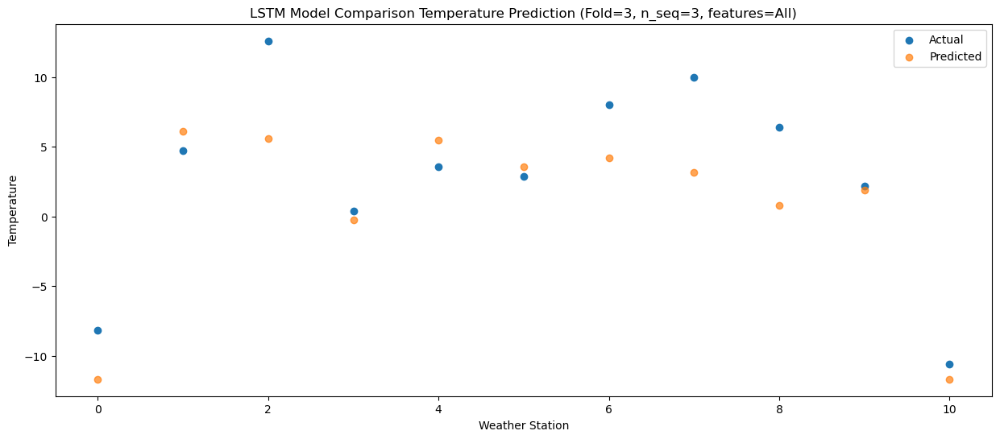

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   -1.35  -3.396723
1                 1   16.67  14.413277
2                 2   13.75  13.883277
3                 3   10.63   8.043277
4                 4   16.64  13.743277
5                 5   14.18  11.863277
6                 6   10.99  12.493277
7                 7   11.57  11.413277
8                 8    6.18   9.093277
9                 9    7.19  10.173277
10               10   -3.41  -3.396723


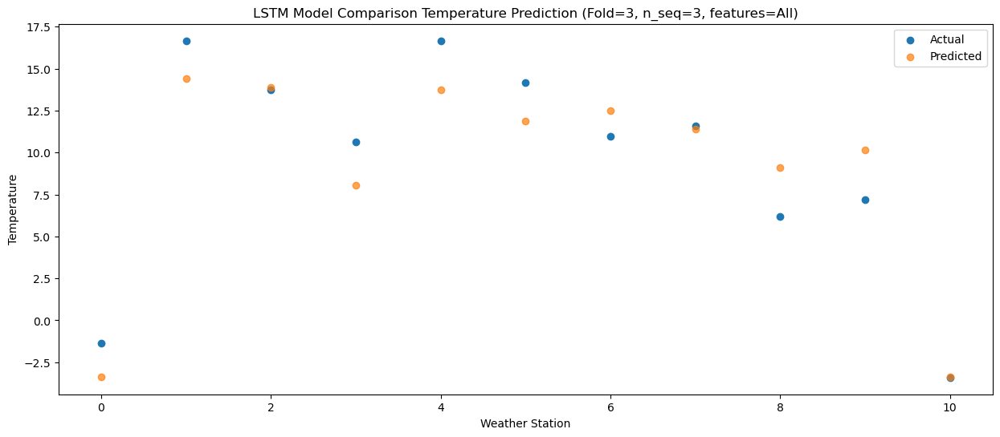

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (1, 1, 1024)              12996608  
                                                                 
 dropout_6 (Dropout)         (1, 1, 1024)              0         
                                                                 
 lstm_7 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_7 (Dropout)         (1, 1024)                 0         
                                                                 
 dense_9 (Dense)             (1, 256)                  262400    
                                                                 
 dense_10 (Dense)            (1, 128)                  32896     
                                                                 
 dense_11 (Dense)            (1, 3)                   

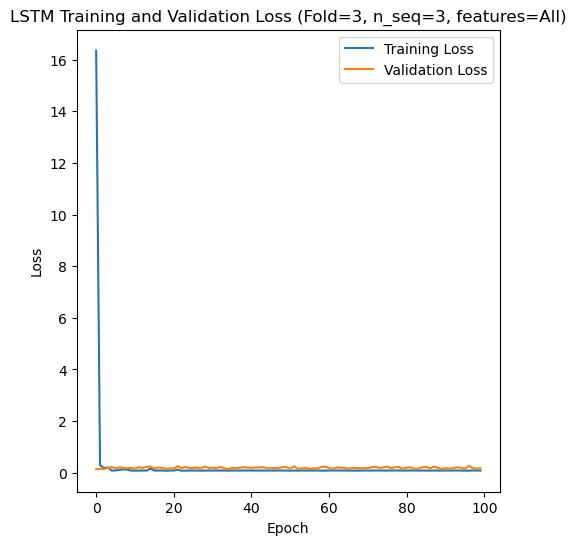

Epoch 1/100
84/84 [==============================] - 42s 237ms/step - loss: 20.3342 - accuracy: 0.6786 - mae: 19.1289 - rmse: 20.3342 - mape: 3497.4319 - pearson: 0.6359 - val_loss: 0.2107 - val_accuracy: 0.0000e+00 - val_mae: 0.1586 - val_rmse: 0.2107 - val_mape: 34.4130 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 14s 164ms/step - loss: 0.1532 - accuracy: 0.8929 - mae: 0.1309 - rmse: 0.1532 - mape: 23.9491 - pearson: 0.8224 - val_loss: 0.2770 - val_accuracy: 0.0000e+00 - val_mae: 0.2091 - val_rmse: 0.2770 - val_mape: 44.8584 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 14s 171ms/step - loss: 0.2241 - accuracy: 0.8810 - mae: 0.2005 - rmse: 0.2241 - mape: 37.8622 - pearson: 0.8484 - val_loss: 0.2135 - val_accuracy: 0.0000e+00 - val_mae: 0.1642 - val_rmse: 0.2135 - val_mape: 35.3061 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 14s 168ms/step - loss: 0.3849 - accuracy: 0.8452 - mae: 0.3566 - rmse: 0.3849 - m

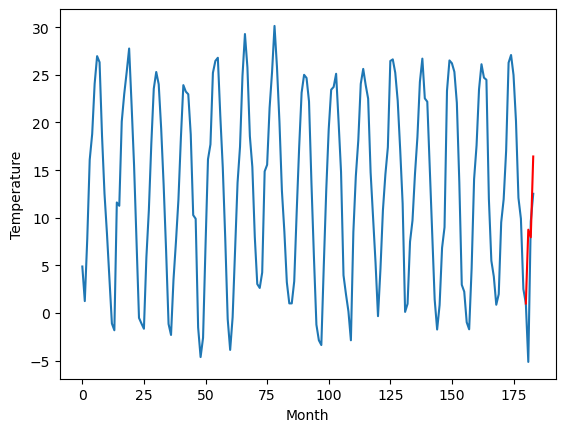

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.34		7.08		-1.26
11.77		6.28		-5.49
13.37		14.75		1.38
[180, 181, 182, 183]
[14.25, 7.076277091503143, 6.275855793952942, 14.752898945808411]


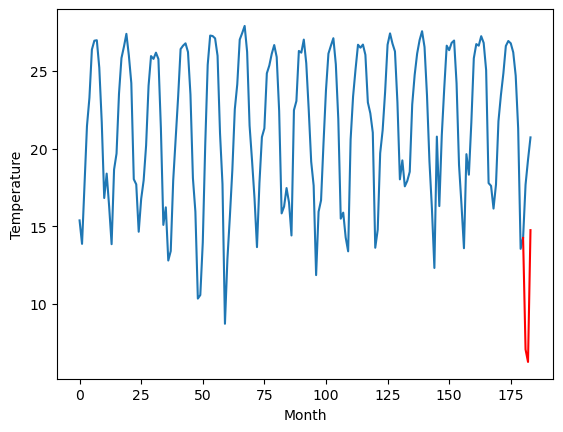

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		3.70		-0.59
2.37		2.90		0.53
11.70		11.37		-0.33
[180, 181, 182, 183]
[9.06, 3.696277091503143, 2.8958557939529417, 11.37289894580841]


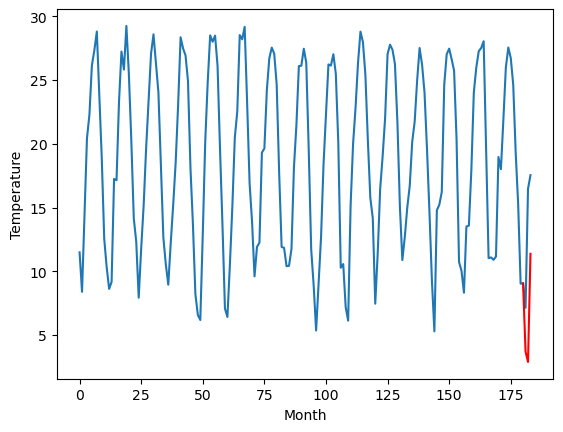

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.70		3.06		0.36
-0.76		2.26		3.02
10.20		10.73		0.53
[180, 181, 182, 183]
[7.48, 3.0562770915031434, 2.255855793952942, 10.732898945808412]


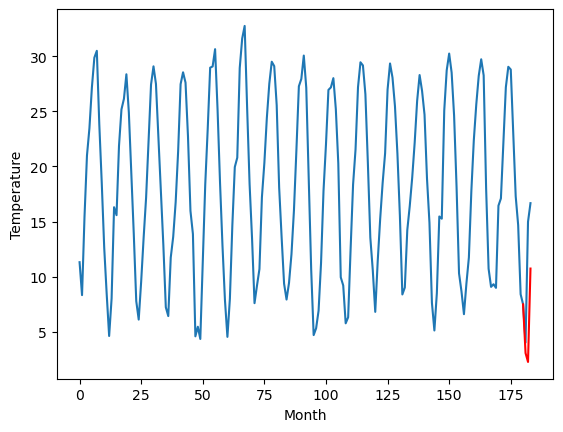

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		4.33		0.04
0.40		3.53		3.13
11.32		12.00		0.68
[180, 181, 182, 183]
[7.33, 4.326277091503143, 3.5258557939529416, 12.002898945808411]


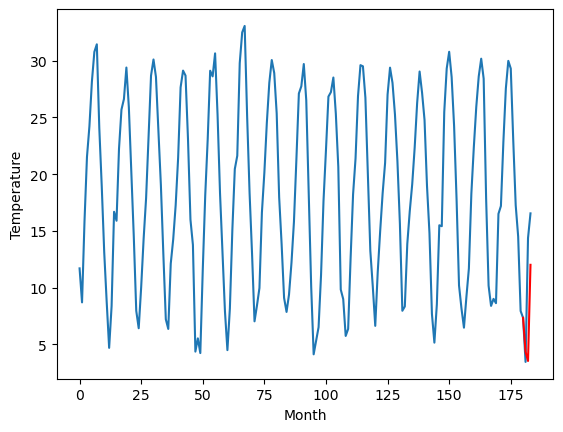

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.28		14.82		0.54
12.71		14.02		1.31
21.96		22.49		0.53
[180, 181, 182, 183]
[6.59, 14.816277091503144, 14.015855793952943, 22.492898945808413]


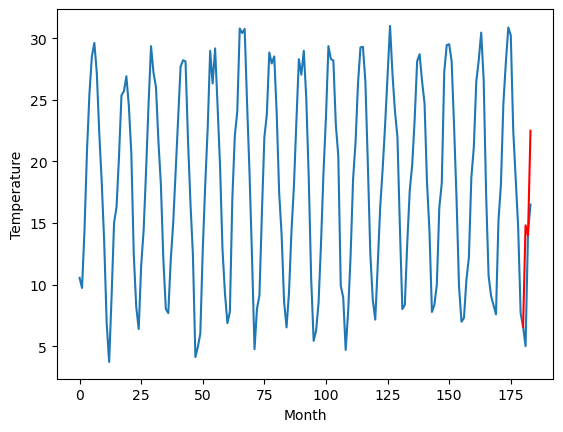

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.72		10.93		-0.79
12.39		10.13		-2.26
18.79		18.60		-0.19
[180, 181, 182, 183]
[6.04, 10.926277091503144, 10.125855793952942, 18.602898945808413]


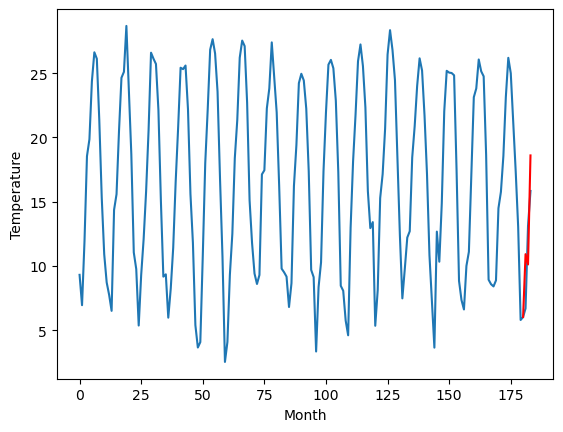

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.64		10.75		1.11
6.03		9.95		3.92
18.30		18.42		0.12
[180, 181, 182, 183]
[3.13, 10.746277091503144, 9.945855793952942, 18.422898945808413]


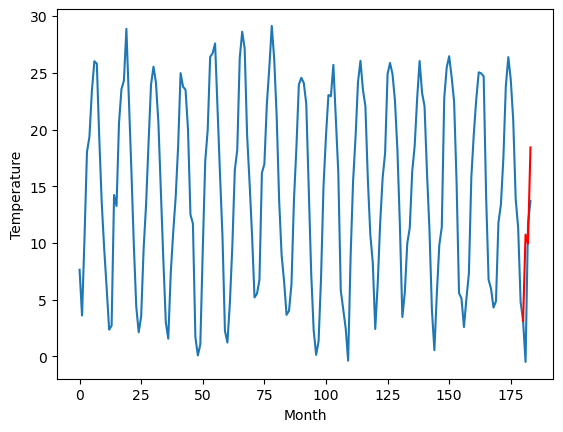

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.11		11.13		1.02
6.75		10.33		3.58
18.72		18.80		0.08
[180, 181, 182, 183]
[-0.29, 11.126277091503143, 10.325855793952941, 18.80289894580841]


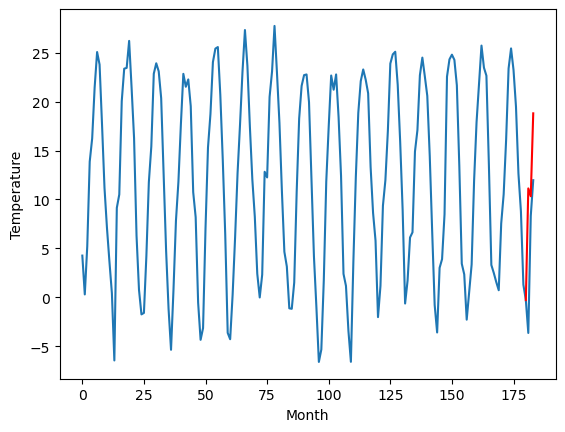

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		10.00		1.47
4.09		9.20		5.11
17.95		17.67		-0.28
[180, 181, 182, 183]
[-1.03, 9.996277091503144, 9.195855793952942, 17.672898945808413]


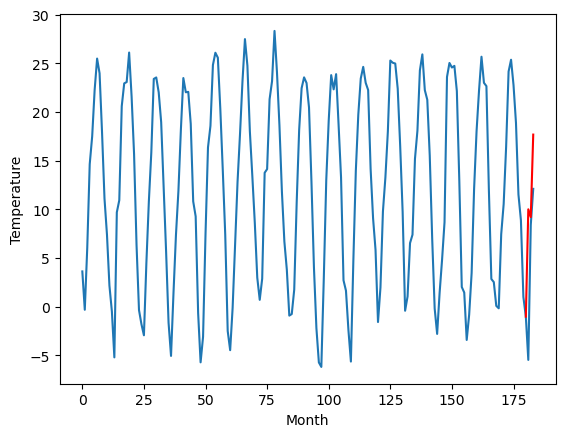

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.40		8.76		1.36
5.16		7.96		2.80
15.05		16.43		1.38
[180, 181, 182, 183]
[-2.29, 8.756277091503144, 7.955855793952942, 16.43289894580841]


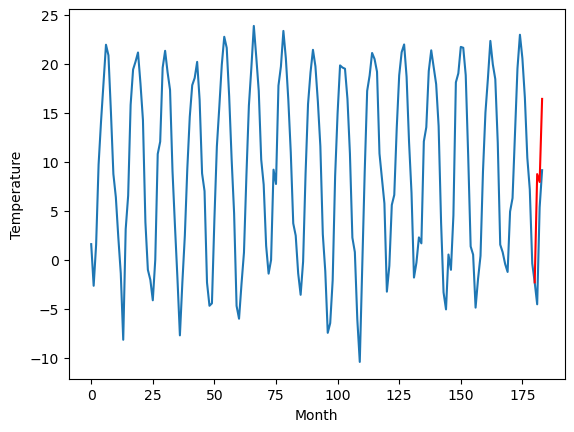

RangeIndex(start=1, stop=12, step=1)
[7.810000000000001, 8.339999999999998, 4.290000000000002, 2.7000000000000006, 4.289999999999999, 14.280000000000001, 11.719999999999999, 9.64, 10.11, 8.53, 7.4]
[8.756277091503144, 7.076277091503143, 3.696277091503143, 3.0562770915031434, 4.326277091503143, 14.816277091503144, 10.926277091503144, 10.746277091503144, 11.126277091503143, 9.996277091503144, 8.756277091503144]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.81   8.756277
1                 1    8.34   7.076277
2                 2    4.29   3.696277
3                 3    2.70   3.056277
4                 4    4.29   4.326277
5                 5   14.28  14.816277
6                 6   11.72  10.926277
7                 7    9.64  10.746277
8                 8   10.11  11.126277
9                 9    8.53   9.996277
10               10    7.40   8.756277


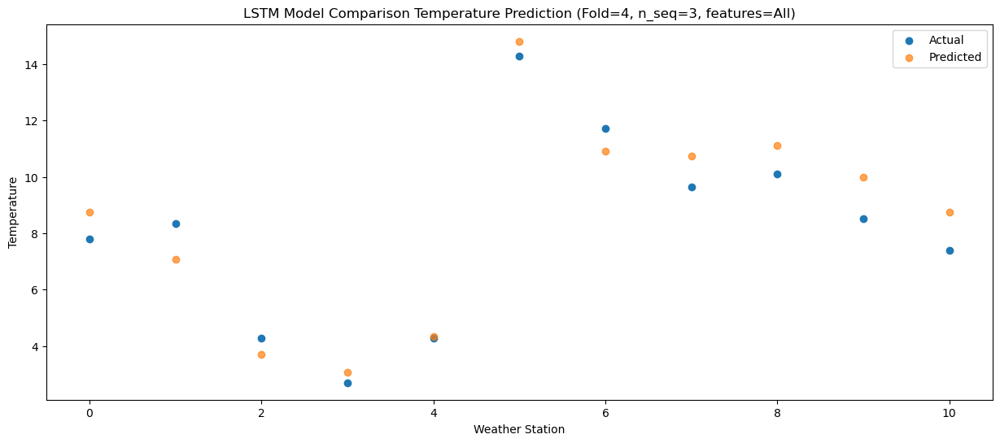

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.68   7.955856
1                 1   11.77   6.275856
2                 2    2.37   2.895856
3                 3   -0.76   2.255856
4                 4    0.40   3.525856
5                 5   12.71  14.015856
6                 6   12.39  10.125856
7                 7    6.03   9.945856
8                 8    6.75  10.325856
9                 9    4.09   9.195856
10               10    5.16   7.955856


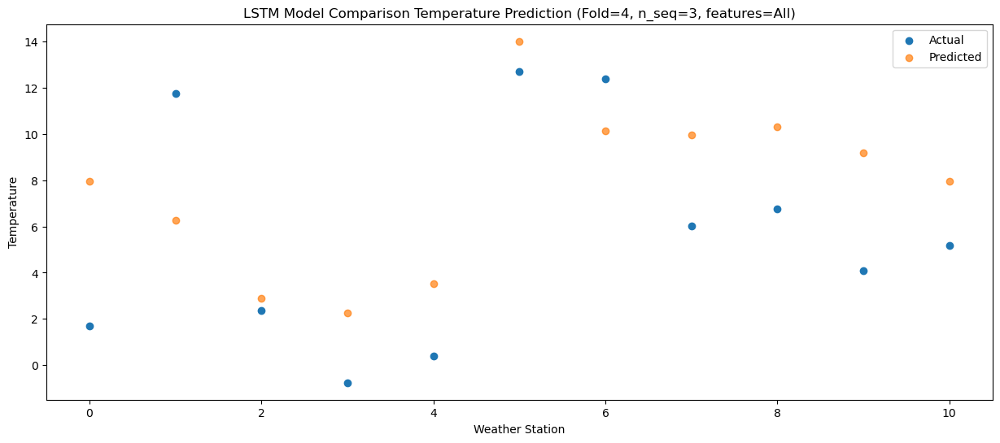

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.41  16.432899
1                 1   13.37  14.752899
2                 2   11.70  11.372899
3                 3   10.20  10.732899
4                 4   11.32  12.002899
5                 5   21.96  22.492899
6                 6   18.79  18.602899
7                 7   18.30  18.422899
8                 8   18.72  18.802899
9                 9   17.95  17.672899
10               10   15.05  16.432899


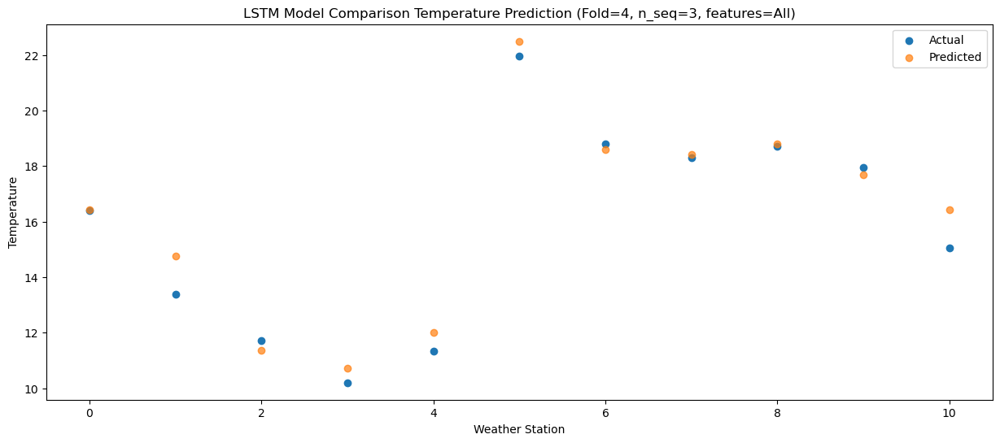

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (1, 1, 1024)              12996608  
                                                                 
 dropout_8 (Dropout)         (1, 1, 1024)              0         
                                                                 
 lstm_9 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_9 (Dropout)         (1, 1024)                 0         
                                                                 
 dense_12 (Dense)            (1, 256)                  262400    
                                                                 
 dense_13 (Dense)            (1, 128)                  32896     
                                                                 
 dense_14 (Dense)            (1, 3)                   

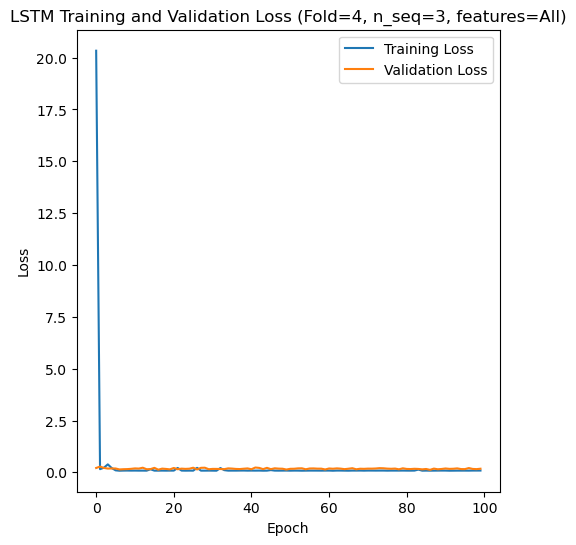

[[0.8503553076374668, 2.4239995147572153, 1.08591255193089], [0.837408176071406, 3.8169236276581113, 1.0564061694499989], [2.077489605606034, 2.9850565997170815, 3.4294618596673847], [1.3838352222847474, 3.8298600110065437, 2.1196201811941036], [0.959967119275016, 3.784582648320532, 0.6809365327448754]]
[[0.7239769242026596, 2.2183607968417087, 0.8609214435924198], [0.79645083210685, 3.2991718981482774, 0.8943926069953222], [1.8324547290801994, 2.5908247626911503, 2.1759409462321884], [1.0892801787636497, 2.983170502402565, 1.8006111838600851], [0.8610350415923378, 3.4000900506973255, 0.5031358844583685]]
[[0.0847990968876487, 0.36030867310729175, 0.05226249704234314], [0.08511156518250358, 0.3758667901767377, 0.05546502201137477], [0.2361750610464144, 0.4450380238765263, 0.17882313108390985], [0.21023073649578805, 0.5362003365833874, 0.29841027514139545], [0.11156652662769569, 1.7692739679079685, 0.036186391729997554]]
[[0.8843711003924806, 0.4647128465307424, 0.842514751392121], [0.8

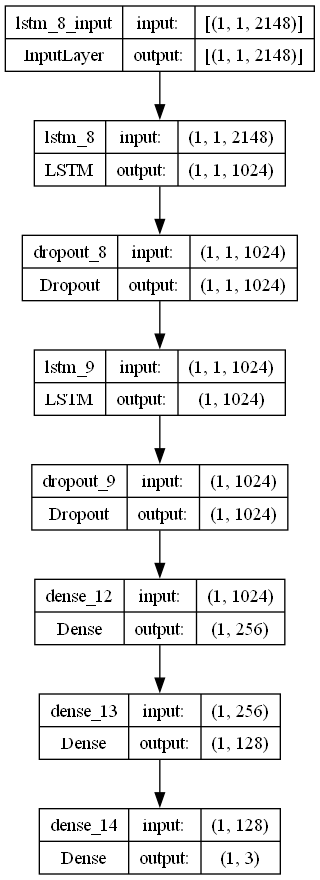

In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.030627019615005892
    optimizer = RMSprop(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.2703833977181008

    # design network
    model = Sequential()
    #model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with an LSTM,
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S3.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)